#Numerical regression

in this example we will use Keras to predict wages based on various professional and demographic factors.

In [1]:
# Import standard Libraries
import pandas as pd
import seaborn as sns
import altair as alt
import tensorflow as tf
import matplotlib.pyplot as plt



sns.set(rc={'figure.figsize':(10,10)})
print("imports ok")

imports ok


In [90]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##Load Data

In [7]:
# Load data file
# load dataset into Pandas DataFrame
data = pd.read_csv('/content/drive/MyDrive/Session CSVs/002_BUILDINGS_ALL.csv')
pd.options.display.max_columns = None


In [ ]:
print(data.info())

In [ ]:
data.describe()

In [ ]:
for colname, col in data.iteritems():
  print(colname, "min_val", col.min(), "max_val", col.max())

## preparation

In [16]:
data.columns

Index(['Unnamed: 0', 'census_year', 'block_id', 'property_id',
       'clue_small_area', 'predominant_space_use', 'accessibility_rating',
       'longitude', 'latitude', 'centroid', 'geometry_y', 'geometry',
       'buffer_500', 'buffer_1000', 'buffer_1500', 'Amenities_Count_500',
       'Unique_Categories_500', 'Amenities_Count_1000',
       'Unique_Categories_1000', 'Amenities_Count_1500',
       'Unique_Categories_1500', 'Land_Diversity_500', 'Land_Diversity_1000',
       'Land_Diversity_1500', 'Price', 'KPI Greenery', 'KPI CO2 Absorption',
       'KPI Safety', 'dist_to_tram_stop', 'dist_to_bus_stop', 'Reviews_Text'],
      dtype='object')

In [8]:
import pandas as pd
from textblob import TextBlob
from sklearn.preprocessing import LabelEncoder
import numpy as np
import random

# Assuming your data is loaded in a pandas DataFrame called 'data'

# Dropping _500 and _1500 columns
cols_to_drop = [col for col in data.columns if '_500' in col or '_1500' in col or col == 'accessibility_rating' or col == 'geometry' or col == 'buffer_1000']
data.drop(columns=cols_to_drop, inplace=True)

# Dropping 'Unnamed: 0' column
data.drop(columns='Unnamed: 0', inplace=True)

# Renaming 'dist_to_tram_stop' and 'dist_to_bus_stop'
data.rename(columns={'dist_to_tram_stop': 'Tram_Distance', 'dist_to_bus_stop': 'Bus_Distance'}, inplace=True)

# Creating new column 'Distance_Metro' using randomizer
min_distance = min(data['Tram_Distance'].min(), data['Bus_Distance'].min())
max_distance = max(data['Tram_Distance'].max(), data['Bus_Distance'].max())
data['Distance_Metro'] = np.random.uniform(min_distance, max_distance, len(data))

# Creating new column 'Sentiment_Score'
def get_sentiment(text):
    # Using TextBlob to analyze sentiment
    testimonial = TextBlob(text)
    return testimonial.sentiment.polarity

data['Sentiment_Score'] = data['Reviews_Text'].apply(get_sentiment)

# Creating 'Area Code' column
le = LabelEncoder()
data['Area Code'] = le.fit_transform(data['clue_small_area'])




In [ ]:
# Saving the dataframe
data.to_csv('/content/drive/MyDrive/Session CSVs/ALL_buildings_PRETRAIN.csv', index=False)

In [ ]:
data

In [25]:
# Make a copy of 'data' and assign it to 'new_data'
new_data = data.copy()

# Drop the specified columns from 'new_data'
new_data.drop(columns=['census_year', 'block_id', 'property_id', 'clue_small_area', 'predominant_space_use', 'latitude', 'longitude', 'centroid', 'geometry_y', 'Reviews_Text'], inplace=True)


In [ ]:
# Saving the dataframe
data.to_csv('/content/drive/MyDrive/Session CSVs/ALL_buildings_PRETRAIN.csv', index=False)

In [ ]:
new_data

In [48]:
# Create a list of tuples, where each tuple is (Area Code, clue_small_area)
area_code_small_area_pairs = data[['Area Code', 'clue_small_area']].drop_duplicates().values.tolist()

# Print the list of pairs
for pair in area_code_small_area_pairs:
    print(f"Area Code: {pair[0]}, Clue Small Area: {pair[1]}")


Area Code: 12, Clue Small Area: West Melbourne (Residential)
Area Code: 0, Clue Small Area: Carlton
Area Code: 4, Clue Small Area: Melbourne (CBD)
Area Code: 6, Clue Small Area: North Melbourne
Area Code: 3, Clue Small Area: Kensington
Area Code: 8, Clue Small Area: Port Melbourne
Area Code: 2, Clue Small Area: East Melbourne
Area Code: 9, Clue Small Area: South Yarra
Area Code: 1, Clue Small Area: Docklands
Area Code: 7, Clue Small Area: Parkville
Area Code: 5, Clue Small Area: Melbourne (Remainder)
Area Code: 11, Clue Small Area: West Melbourne (Industrial)
Area Code: 10, Clue Small Area: Southbank


In [49]:
new_data

,Amenities_Count_1000,Unique_Categories_1000,Land_Diversity_1000,Price,KPI Greenery,KPI CO2 Absorption,KPI Safety,Tram_Distance,Bus_Distance,Distance_Metro,Sentiment_Score,Area Code
0,1125,16,-289.842781,645000.0,2.380952,0.882377,0.472407,0.005198,0.000607,0.029832,0.238613,12
1,1125,16,-289.842781,792000.0,2.380952,0.882377,0.472407,0.005198,0.000607,0.019618,0.238613,12
2,1125,19,-593.681545,860000.0,7.065217,1.764754,1.202491,0.006594,0.003451,0.014529,0.233333,0
3,1125,19,-593.681545,860000.0,7.065217,1.764754,1.202491,0.006594,0.003451,0.037584,0.238613,0
4,1125,19,-615.417478,860000.0,7.065217,1.764754,1.202491,0.006594,0.003451,0.023298,0.233333,0
...,...,...,...,...,...,...,...,...,...,...,...,...
24142,47,7,0.678734,1370000.0,0.931677,0.485712,8.181233,0.008326,0.001731,0.028332,0.198054,1
24143,237,16,-186.304385,1300000.0,0.621118,0.437141,0.794503,0.008442,0.009079,0.006365,0.378988,2
24144,47,5,-20.276563,1550000.0,0.543478,0.501902,0.042946,0.024565,0.002644,0.024254,0.581071,3
24145,47,5,-24.019771,1300000.0,0.543478,0.493807,0.042946,0.023482,0.003223,0.026150,0.581071,3


In [50]:
# Compute the mean of Tram_Distance, Bus_Distance, and Distance_Metro and store in a new column called 'Transport KPI'
new_data['Transport KPI'] = new_data[['Tram_Distance', 'Bus_Distance', 'Distance_Metro']].mean(axis=1)

# Drop the original columns
new_data = new_data.drop(['Tram_Distance', 'Bus_Distance', 'Distance_Metro'], axis=1)


In [58]:
# Rename columns in the dataframe as per your requirements
new_data.rename(columns={
    'Amenities_Count_1000': 'Amenities Count',
    'Unique_Categories_1000': 'Unique Categories',
    'Land_Diversity_1000': 'Land-Use Diversity',
    'Price': 'Price',
    'KPI Greenery': 'KPI Greenery',
    'KPI CO2 Absorption': 'KPI CO2 Absorption',
    'KPI Safety': 'KPI Safety',
    'Sentiment_Score': 'Sentiment'
}, inplace=True)

# Now, your parallel coordinates plot generation code should work.


In [ ]:
# Create pairplot with 'Area Code' as hue
sns.pairplot(new_data, hue='Area Code')

# Show the plot
plt.show()

# Then drop 'Area Code' from 'new_data' after the plot if you no longer need it
new_data.drop(columns=['Area Code'], inplace=True)

In [59]:
from sklearn.preprocessing import MinMaxScaler

# Initialize a scaler with feature_range (1,10)
scaler = MinMaxScaler(feature_range=(1, 10))

# Compute the minimum and maximum to be used for later scaling
scaler.fit(new_data)

# Perform scaling on data
new_data_scaled = scaler.transform(new_data)

# Replace the original data with the scaled data
new_data = pd.DataFrame(new_data_scaled, columns=new_data.columns)


In [60]:
# Creating a dictionary mapping 'Area Code' to 'clue_small_area'
area_code_to_name = dict(zip(data['Area Code'], data['clue_small_area']))


In [87]:
new_data

,Amenities Count,Unique Categories,Land Diversity,Price,KPI Greenery,KPI CO2 Absorption,KPI Safety,Sentiment,Area Code,Transport KPI,clue_small_area
0,4.033253,6.538462,7.391913,1.902074,1.214286,1.072187,1.048328,3.691426,12,4.526964,West Melbourne (Residential)
1,4.033253,6.538462,7.391913,2.206912,1.214286,1.072187,1.048328,3.691426,12,3.477940,West Melbourne (Residential)
2,4.033253,7.576923,4.695216,2.347926,1.635870,1.151665,1.123017,3.636943,0,3.390676,Carlton
3,4.033253,7.576923,4.695216,2.347926,1.635870,1.151665,1.123017,3.691426,0,5.758465,Carlton
4,4.033253,7.576923,4.502300,2.347926,1.635870,1.151665,1.123017,3.636943,0,4.291246,Carlton
...,...,...,...,...,...,...,...,...,...,...,...
24142,1.126723,3.423077,9.970413,3.405530,1.083851,1.036458,1.836954,3.272914,1,4.809598,Docklands
24143,1.639005,6.538462,8.310860,3.260369,1.055901,1.032083,1.081279,5.139875,2,3.320091,East Melbourne
24144,1.126723,2.730769,9.784426,3.778802,1.048913,1.037916,1.004393,7.225068,3,6.152181,Kensington
24145,1.126723,2.730769,9.751204,3.260369,1.048913,1.037187,1.004393,7.225068,3,6.295118,Kensington


In [93]:
# Saving the dataframe
new_data.to_csv('/content/drive/MyDrive/Session CSVs/ALL_buildings_PRETRAIN_02.csv', index=False)

<ipython-input-84-d88d34609a9c>:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  area_means = new_data.groupby('Area Code').mean().reset_index()


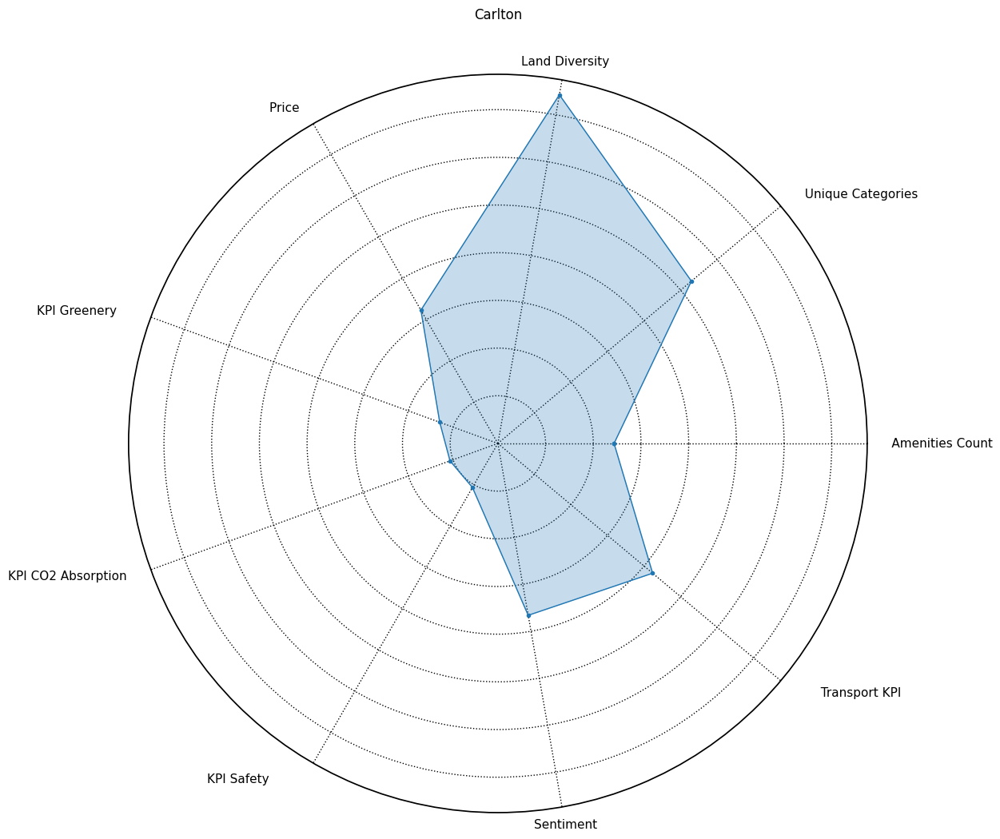

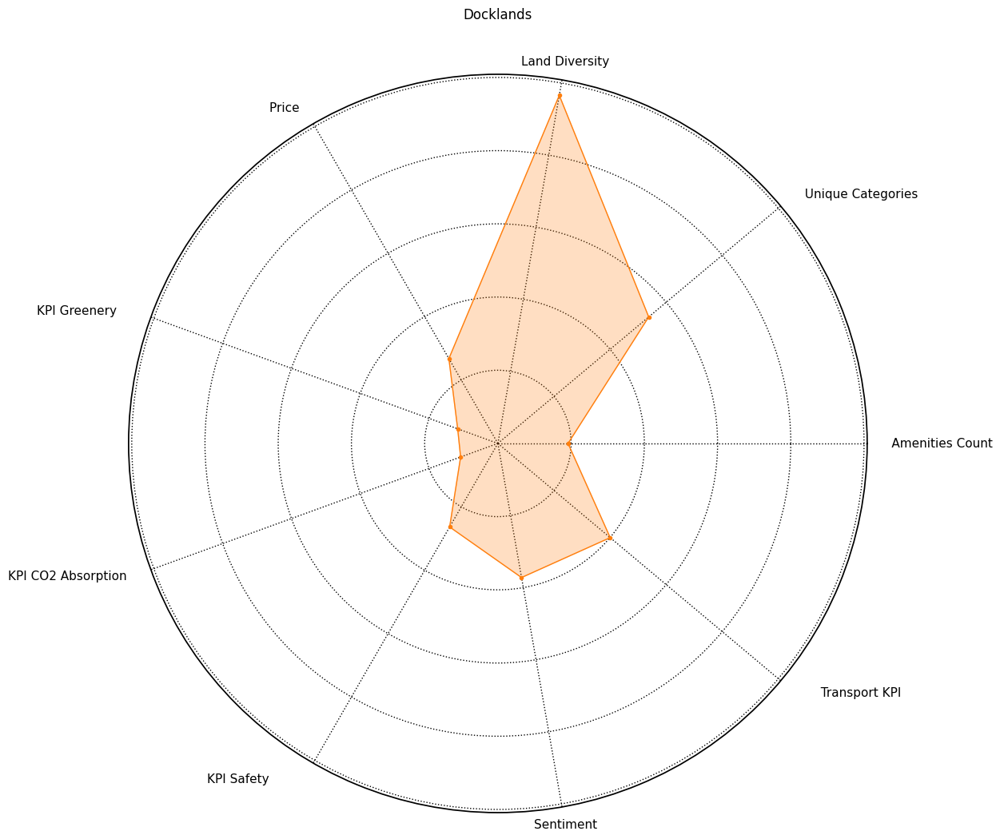

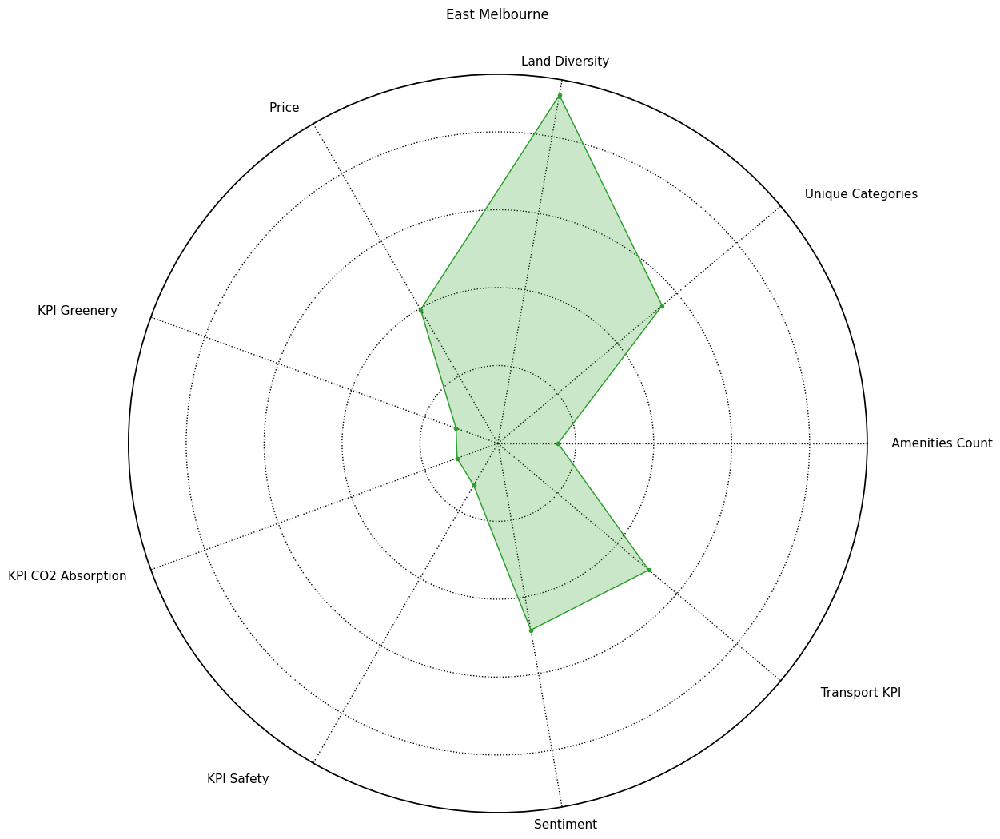

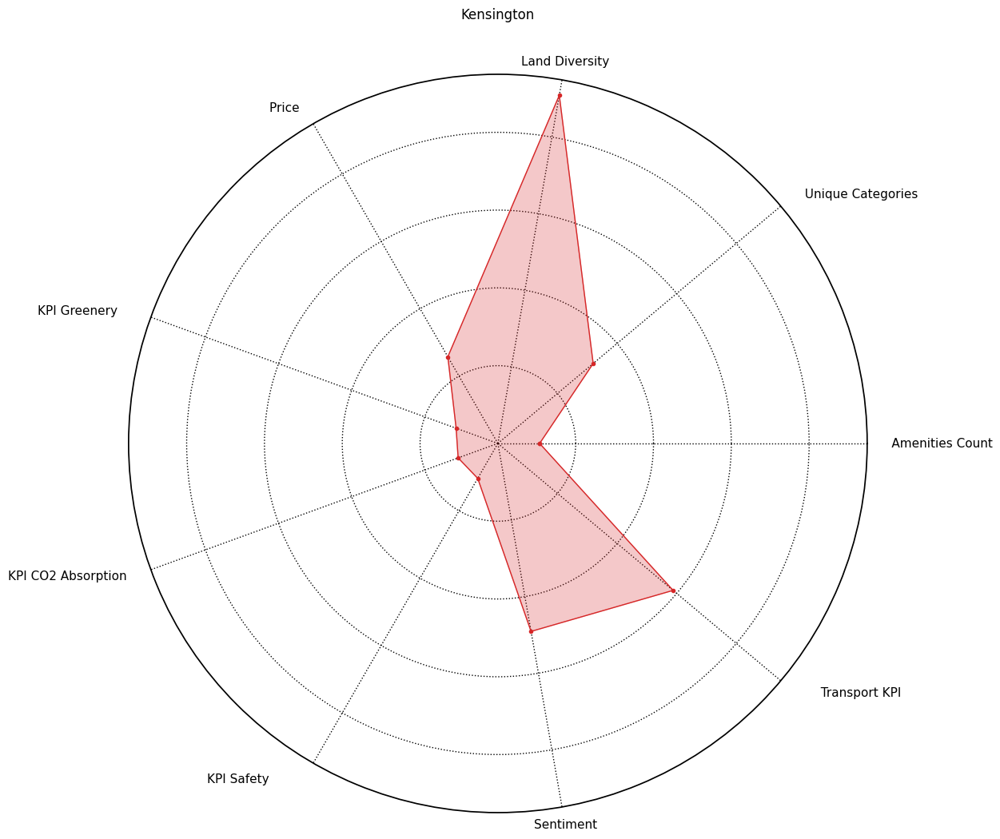

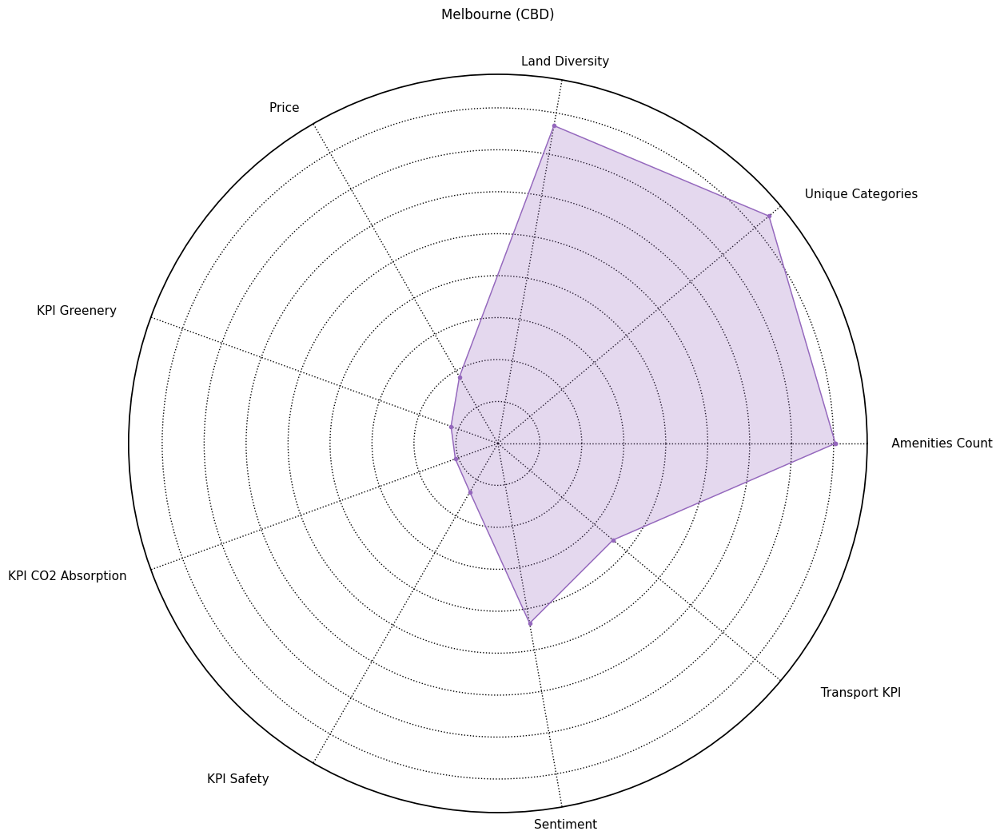

...

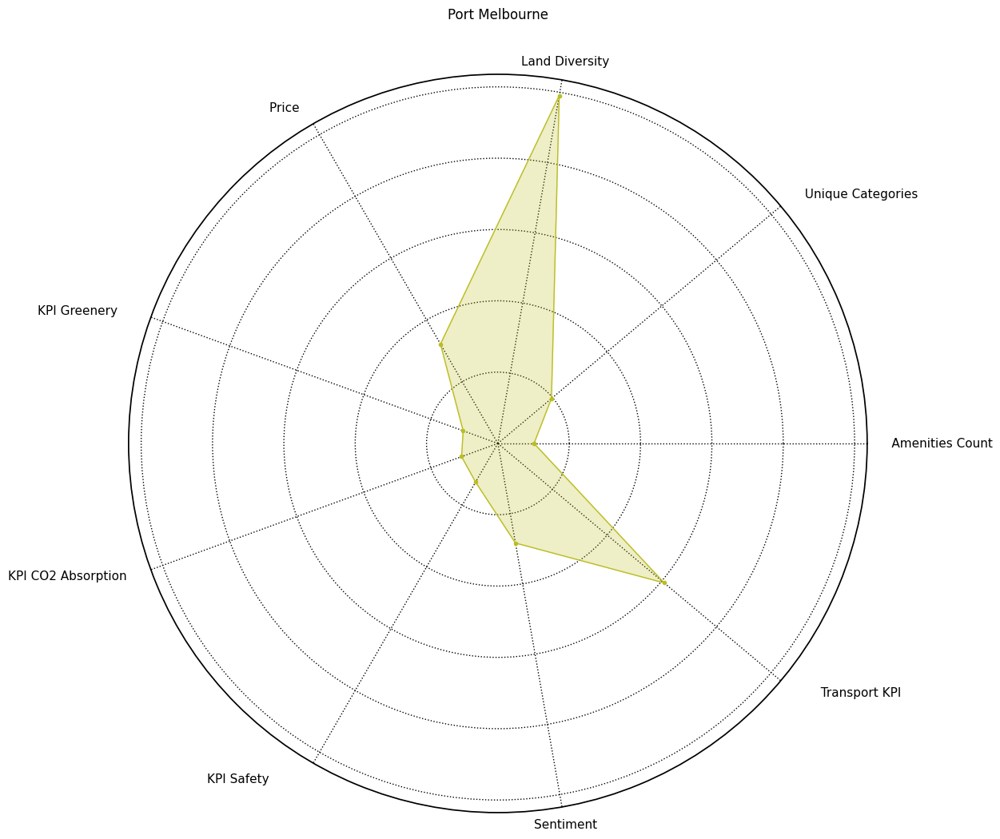

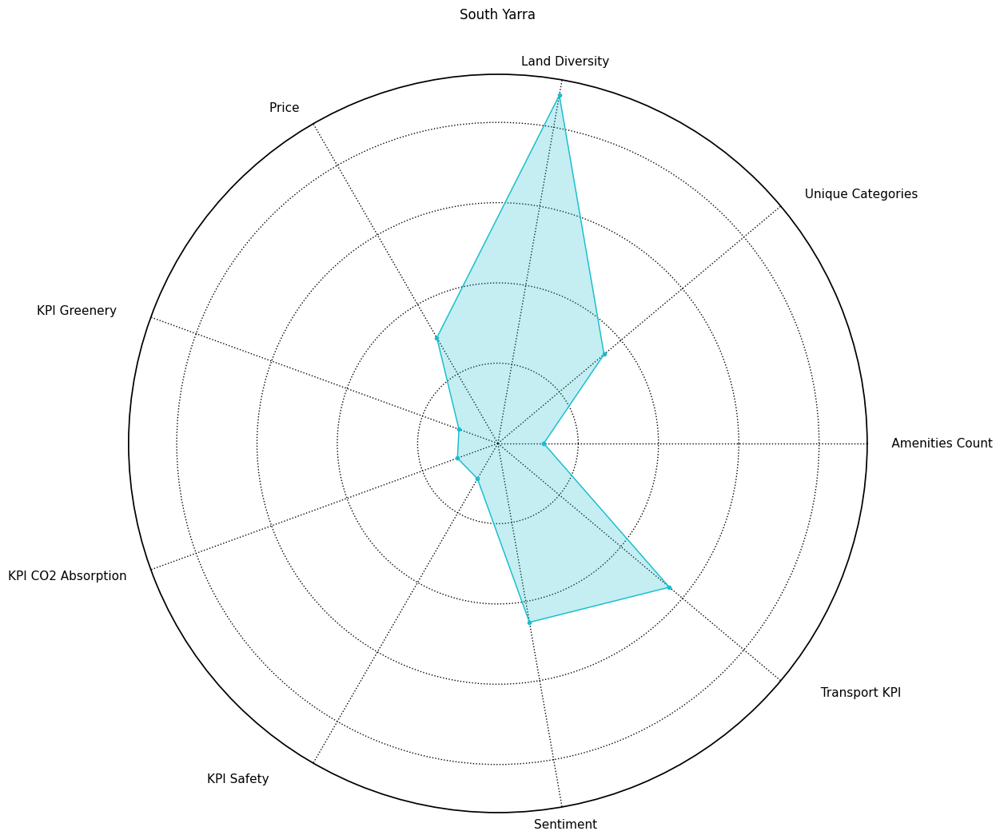

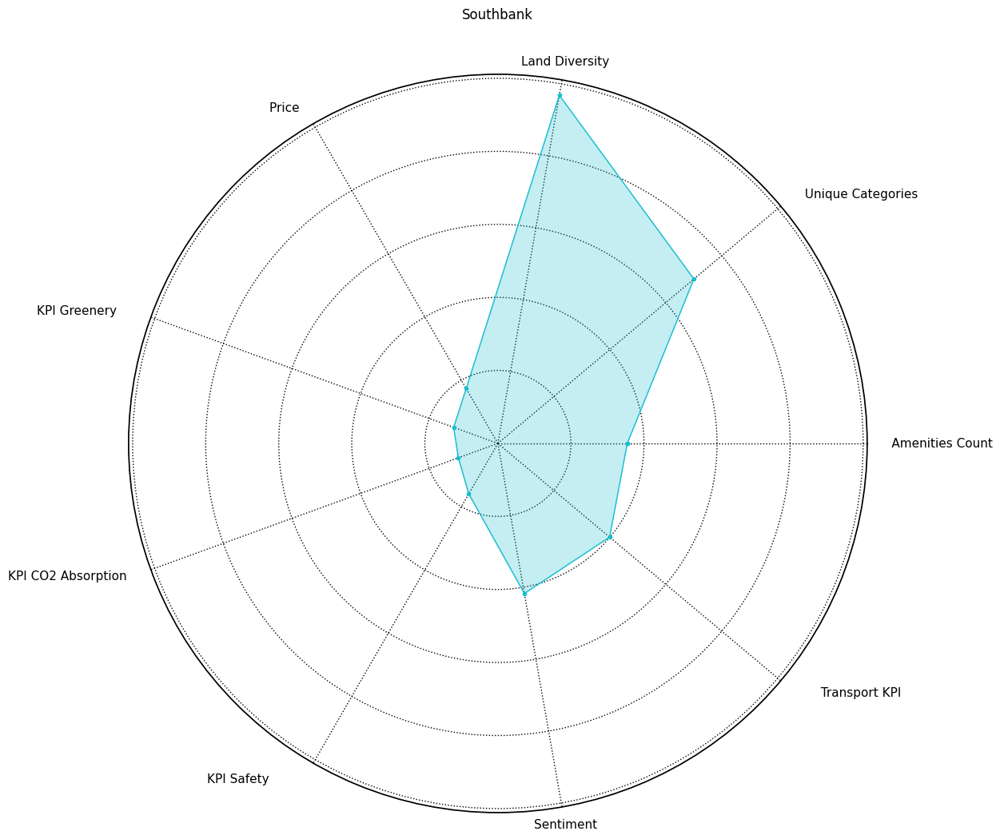

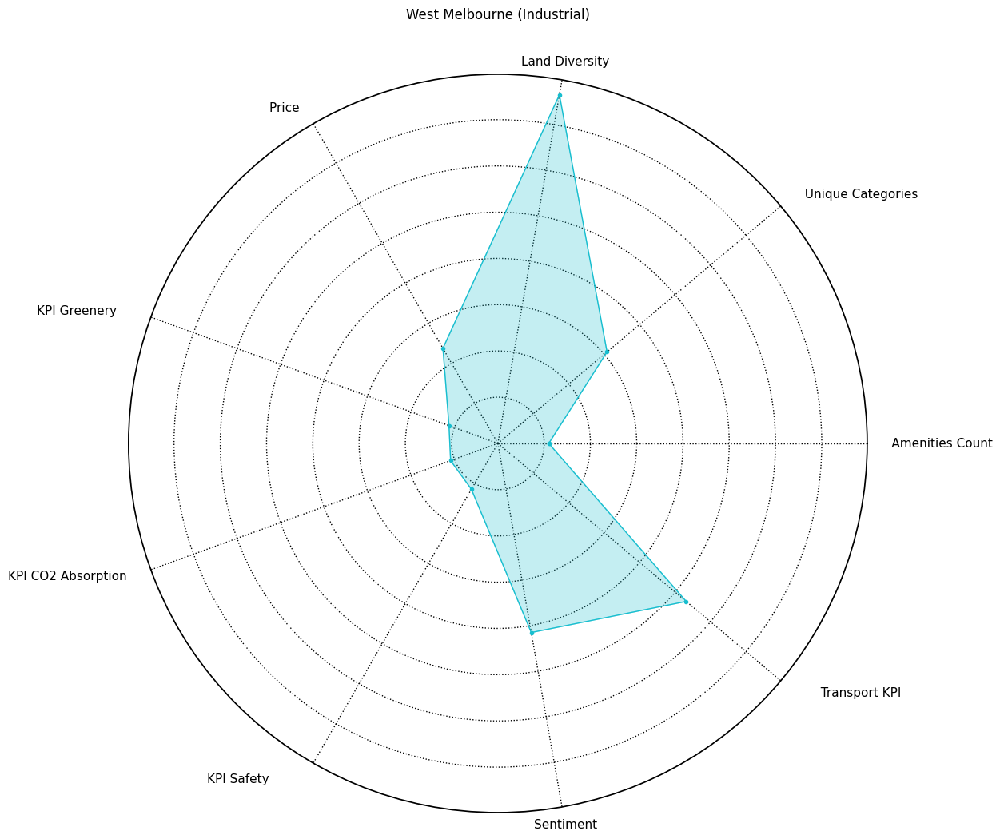

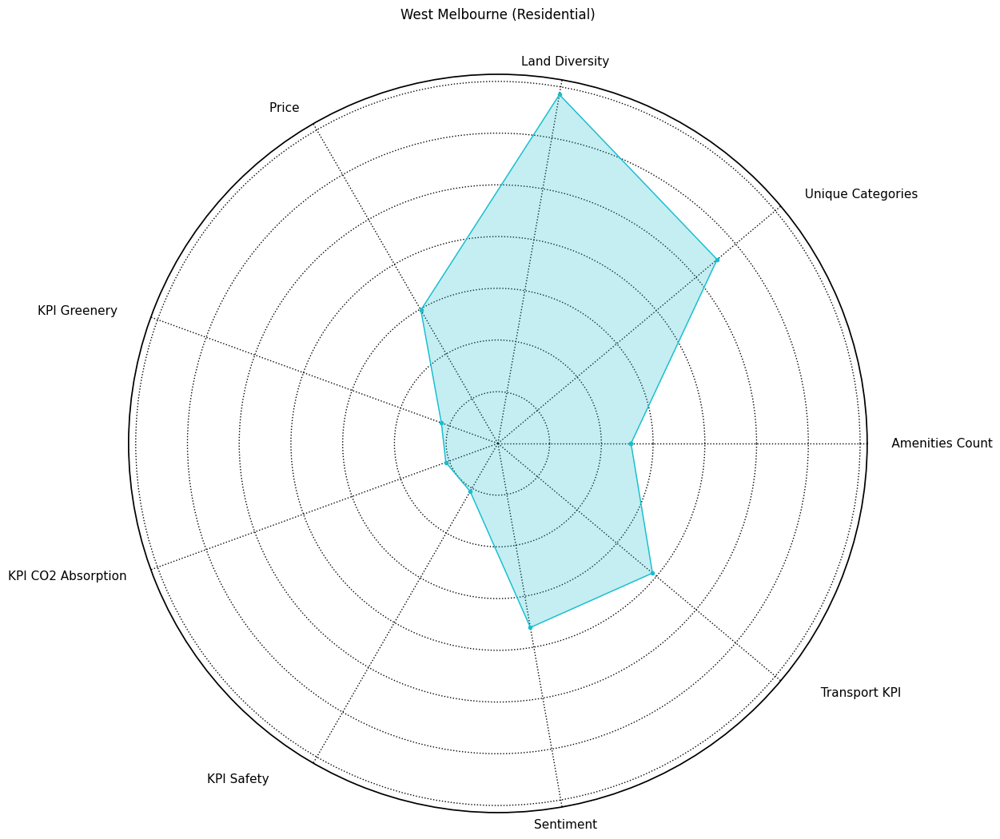

In [84]:
import matplotlib.pyplot as plt
import numpy as np

# Adding 'Area Code' to new_data from data
new_data['Area Code'] = data['Area Code']

# Group data by 'Area Code' and compute the mean
area_means = new_data.groupby('Area Code').mean().reset_index()

# Creating a color palette
colors = plt.get_cmap('tab10')

# Define your custom labels
new_labels = ['                             Amenities Count', '                                  Unique Categories', 'Land Diversity', 'Price          ',
              'KPI Greenery                             ', 'KPI CO2 Absorption                                  ', 'KPI Safety                                  ', 'Sentiment', '                                  Transport KPI']

# Iterating over area_means and plotting spider plots
for i, row in area_means.iterrows():
    area_code = row['Area Code']
    values = row.drop('Area Code').tolist()
    num_vars = len(values)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    values += values[:1]
    angles += angles[:1]

    # Getting the corresponding 'clue_small_area' name
    area_name = area_code_to_name[area_code]
    color = colors(i)

    fig1, ax1 = plt.subplots(figsize=(12, 12), subplot_kw=dict(polar=True))
    ax1.fill(angles, values, color=color, alpha=0.25)
    ax1.plot(angles, values, color=color, linewidth=1, linestyle='solid', marker='o', markersize=3)
    ax1.set_title(area_name, color='black', pad=50, loc='center', fontsize=12)
    ax1.set_xticks(angles[:-1])
    ax1.set_xticklabels(new_labels, color='black', horizontalalignment='center')
    ax1.set_yticklabels([])
    ax1.grid(linestyle='dotted', color='black')
    ax1.set_rlabel_position(0)
    ax1.set_facecolor('white')  # Ensure the plot background is white
    ax1.spines['polar'].set_color('black')

    plt.show()


<ipython-input-85-b8ec8d2fc12c>:21: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


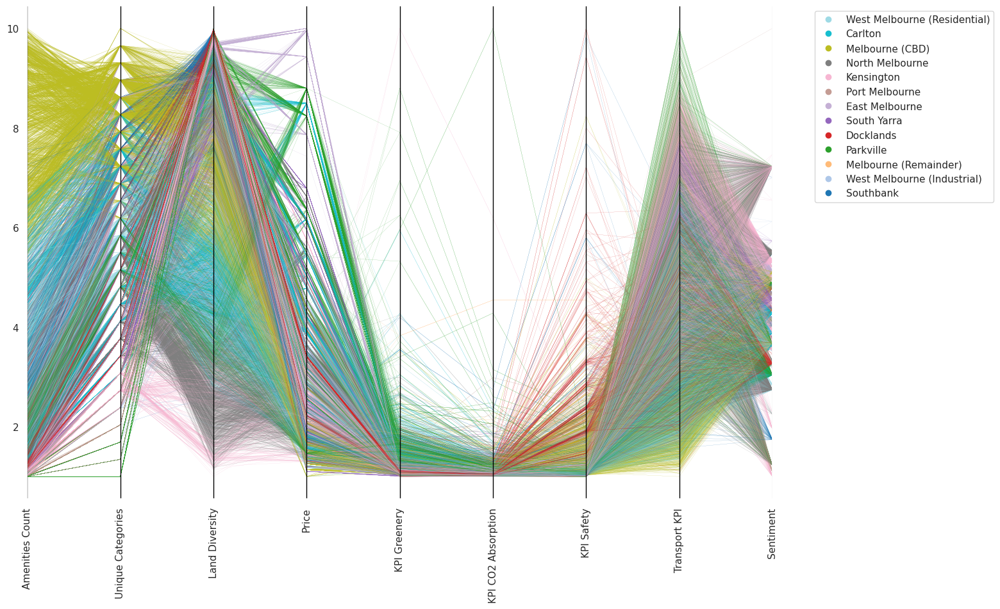

In [85]:
from pandas.plotting import parallel_coordinates
import matplotlib.pyplot as plt

# Define new_labels as per your preference
new_labels = ['Amenities Count', 'Unique Categories', 'Land Diversity', 'Price',
              'KPI Greenery', 'KPI CO2 Absorption', 'KPI Safety', 'Transport KPI', 'Sentiment']

# Add 'clue_small_area' to new_data from data
new_data['clue_small_area'] = data['clue_small_area']

plt.figure(figsize=(15,10))

# Define the color map
cmap = plt.get_cmap('tab20_r')
colors = cmap(np.linspace(0, 1, len(new_data['clue_small_area'].unique())))

pc = parallel_coordinates(new_data, class_column='clue_small_area', cols=new_labels, color=colors, linewidth=0.1)

# Change legend line to circle markers
legend = plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
for handle in legend.legendHandles:
    handle.set_linestyle("")
    handle.set_marker('o')

# Set legend background color
legend.get_frame().set_facecolor('white')

# Set plot background color
plt.gca().set_facecolor('white')

# Rotate x-axis labels
plt.xticks(rotation='vertical')

plt.show()


# training

we can see that some predictors are binary, while others are not

We can see there is a direct relationship between age and experience, but not so much between wage and education, there is a non-linearity

##Prepare Data

**NORMALIZE INPUTS**

In [248]:
sentidf = pd.read_csv('/content/drive/MyDrive/Session CSVs/002_BUILDINGS_ALL.csv') # replace 'pcscores.csv' with the path to your file

In [ ]:
sentidf

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


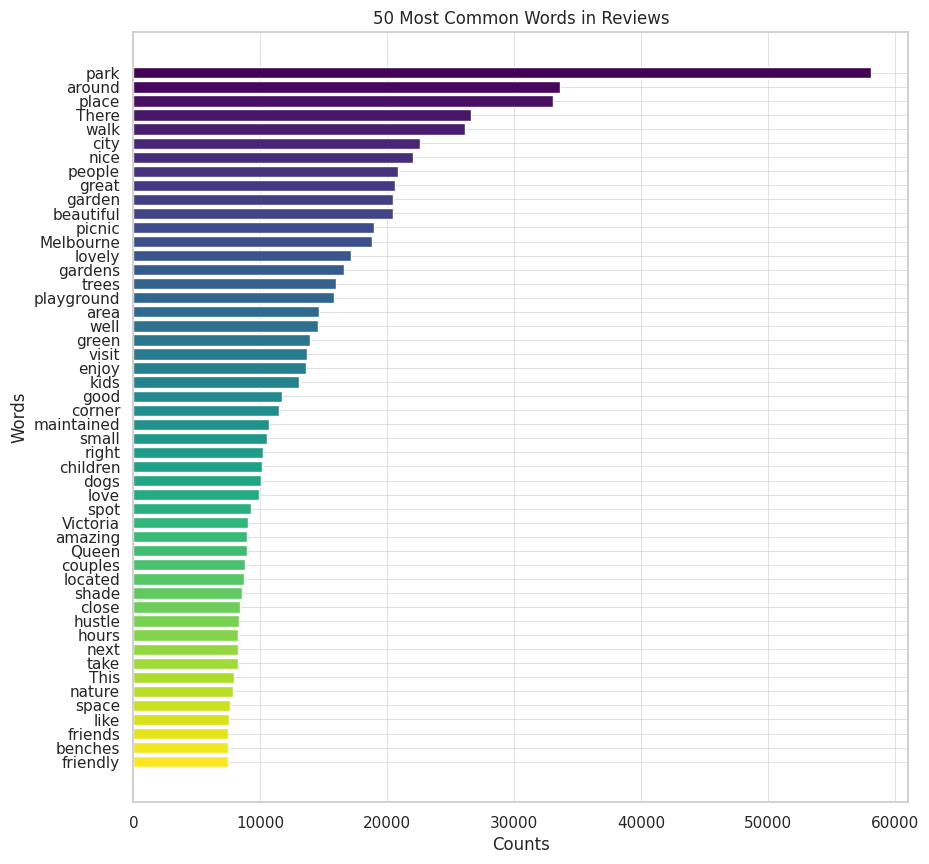

In [253]:
import pandas as pd
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords
from collections import Counter
from nltk.tokenize import word_tokenize
import numpy as np

# If you haven't downloaded the nltk stopwords before, do so
nltk.download('punkt')
nltk.download('stopwords')

# Make sure you turn all the reviews into a single string
all_reviews = ' '.join(sentidf['Reviews_Text'])

# Use nltk's word_tokenize function to split the text into words
tokens = word_tokenize(all_reviews)

# We also want to filter out common words (like "the", "a", etc.) that don't add much meaning
stop_words = set(stopwords.words('english'))

# Add the specific words you want to remove to the set of stopwords
additional_stopwords = ['there', 'peoplee', 'time', 'this', 'still', 'many', 'spotright', 'find','also']
stop_words.update(additional_stopwords)

# Filter out the stopwords, any punctuation, and words that are 3 letters or below
filtered_tokens = [word for word in tokens if word.isalpha() and not word in stop_words and len(word) > 3]

# Now we can use the Counter class to count how often each word appears
word_counts = Counter(filtered_tokens)

# Let's get the 50 most common words
common_words = word_counts.most_common(50)

# Now we can plot the results
words, counts = zip(*common_words)  # unzip the tuples into two lists
plt.figure(figsize=(10,10))
colors = plt.cm.viridis(np.linspace(0, 1, len(words)))
plt.barh(words, counts, color=colors)
plt.xlabel('Counts')
plt.ylabel('Words')
plt.title('50 Most Common Words in Reviews')
plt.gca().invert_yaxis()  # reverse the order of the words
plt.show()


In [254]:
df_pca = pd.read_csv('/content/drive/MyDrive/Session CSVs/pcscores_studio') # replace 'pcscores.csv' with the path to your file

In [255]:
data = pd.read_csv('/content/drive/MyDrive/Session CSVs/ALL_buildings_PRETRAIN_02.csv') # replace 'pcscores.csv' with the path to your file

In [ ]:
data

<ipython-input-256-c9d8452efa0b>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = data.corr()


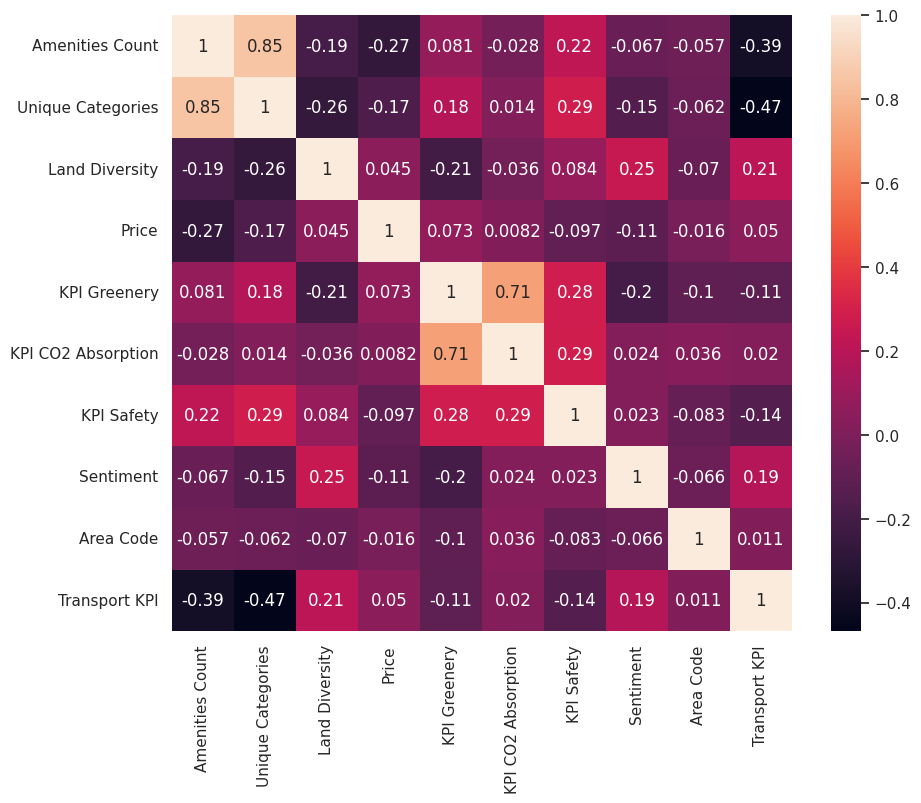

In [256]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
corr = data.corr()

plt.figure(figsize=(10, 8))  # Adjust the figure size if necessary
sns.heatmap(corr, annot=True)
plt.show()


In [257]:
df_pca

,0,1,2,3,4,5,6,7,8
0,2.280158,-0.181769,-0.665053,0.011161,-0.583351,0.276105,-0.185425,0.034121,-0.001235
1,2.548474,-0.106203,0.069769,-0.702823,-0.369584,0.133905,-0.186231,0.036123,0.002454
2,4.014485,2.246660,-0.067211,-0.305854,-0.126776,0.869023,-0.022849,0.310588,-0.085832
3,3.306229,2.160503,-1.155810,1.628699,-0.447944,1.132295,-0.011616,0.297497,-0.092258
4,3.809476,2.393465,-0.510022,0.446604,-0.244300,0.960577,-0.013931,0.299939,-0.087207
...,...,...,...,...,...,...,...,...,...
24142,-2.534159,-0.952595,0.750986,-0.631887,-1.041129,-0.508933,0.692106,-0.379486,-0.020512
24143,0.391580,-0.258946,1.077500,-1.056970,0.991753,1.591417,-0.341657,-0.101934,0.012339
24144,-3.576905,-1.209950,-0.380241,0.724461,2.681607,-0.560177,0.003136,0.019162,-0.062364
24145,-3.533846,-1.253735,-0.887730,0.602485,2.581226,-0.497237,-0.002787,0.024840,-0.065403


In [204]:
# Keeping only numerical columns
df_pca = df_pca.select_dtypes(include=[np.number])


In [ ]:
columns_to_drop = ['clue_small_area','Area Code']

df_pca =df_pca.drop(columns=columns_to_drop)

In [ ]:
data.columns

In [ ]:
print("First column name: ", data.columns[0])
print("Last column name: ", data.columns[-1])


First column name:  area
Last column name:  Urban_Features


In [258]:
# Specify the column to exclude
column_to_exclude = "Price"  # Adjust this parameter if necessary

# Select all columns except the specified one
#X = df_pca.drop(columns=[column_to_exclude])
X = df_pca
# Load and instantiate a StandardScaler
from sklearn.preprocessing import StandardScaler
scalerX = StandardScaler()

# Apply the scaler to our X-features
X_scaled = scalerX.fit_transform(X)

print(X_scaled.shape)


(24147, 9)


In [259]:
#declare regression target
y = data.loc[:,"Price"].to_numpy()


y = y.reshape(-1, 1)

from sklearn.preprocessing import MinMaxScaler
scalerY = MinMaxScaler()


#In this case it makes sense to use MinMax scaling because the wage seems like a relative range
# Apply the scaler to our Y-features
y_scaled = scalerY.fit_transform(y)

print(y_scaled.shape)
# print(y_scaled)


(24147, 1)


**SPLIT INTO TRAIN AND TEST**

In [260]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size = 0.2, random_state = 21)

In [261]:
#visualize our data
#we can see that scikitlearn doesnt care if it is a dataframe or a numpy array, because they all function on the same way
print("TRAIN", "input", X_train.shape, "output", y_train.shape)
print("TEST", "input", X_test.shape, "output", y_test.shape)
# print(X_test)
# print(y_test)

TRAIN input (19317, 9) output (19317, 1)
TEST input (4830, 9) output (4830, 1)


#Build model

From the cheatSheet
Regression between 0 and 1>>
      activation = relu for hidden layers / sigmoid for final layer
      loss = mean squared error
      optimizer = adam
      input from data, is 8 columns
      output is 1 value prediction

In [262]:
# Instantiate a sequential model
tf.random.set_seed(5)
model = tf.keras.models.Sequential()
n_cols = X_scaled.shape[1]

# Add 2 dense layers of 50 and 32 neurons each
model.add(tf.keras.layers.Dense(4, input_shape=(n_cols,), activation='relu'))
model.add(tf.keras.layers.Dense(2, activation='relu'))

# Add a dense layer with 1 value output
model.add(tf.keras.layers.Dense(1, activation= "sigmoid"))

# Compile your model
model.compile(optimizer = "adam", loss = "mean_squared_error")


In [263]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 4)                 40        
                                                                 
 dense_13 (Dense)            (None, 2)                 10        
                                                                 
 dense_14 (Dense)            (None, 1)                 3         
                                                                 
Total params: 53
Trainable params: 53
Non-trainable params: 0
_________________________________________________________________


#Train model

In [264]:
# Fit your model to the training data for 200 epochs
#we assign this to history variable so we can plot the training data
history = model.fit(X_train,y_train,epochs=1000, validation_split=0.2)

Epoch 1/1000
483/483 [==============================] - 1s 2ms/step - loss: 0.0443 - val_loss: 0.0200
Epoch 2/1000
483/483 [==============================] - 1s 1ms/step - loss: 0.0128 - val_loss: 0.0101
Epoch 3/1000
483/483 [==============================] - 1s 1ms/step - loss: 0.0080 - val_loss: 0.0073
Epoch 4/1000
483/483 [==============================] - 1s 2ms/step - loss: 0.0058 - val_loss: 0.0055
Epoch 5/1000
483/483 [==============================] - 1s 2ms/step - loss: 0.0043 - val_loss: 0.0042
Epoch 6/1000
483/483 [==============================] - 1s 1ms/step - loss: 0.0034 - val_loss: 0.0034
Epoch 7/1000
483/483 [==============================] - 1s 1ms/step - loss: 0.0027 - val_loss: 0.0028
Epoch 8/1000
483/483 [==============================] - 1s 1ms/step - loss: 0.0022 - val_loss: 0.0024
Epoch 9/1000
483/483 [==============================] - 1s 1ms/step - loss: 0.0019 - val_loss: 0.0020
Epoch 10/1000
483/483 [==============================] - 1s 2ms/step - loss: 0.001

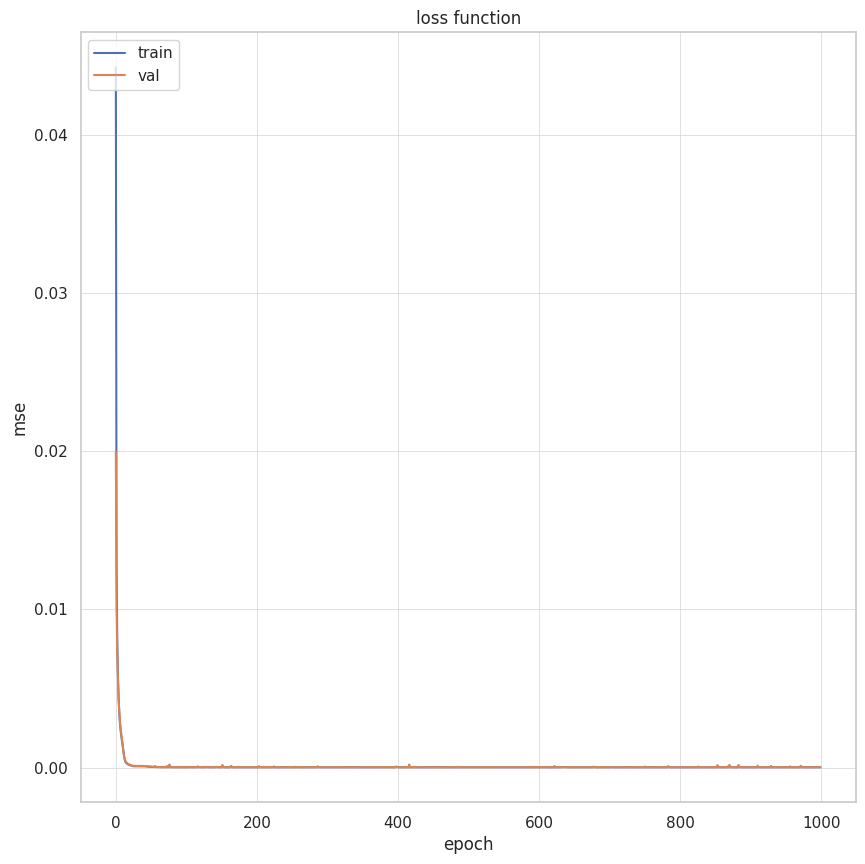

In [265]:
# summarize history for accuracy
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('loss function')
plt.ylabel('mse')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

#Evaluate model on test data



In [266]:
# Evaluate your model accuracy on the test data
loss_test = model.evaluate(X_test,y_test)

# Print accuracy
print('mse_test:', loss_test)

151/151 [==============================] - 0s 931us/step - loss: 1.7398e-05
mse_test: 1.7398237105226144e-05


we can see the model is again slightly overfitting, but what does this translate in terms of USD accuracy of our prediction?

#Plot error


In [267]:
def plot_comparison(x_val, pred, truth, xlab, ylab):
  fig, ax1 = plt.subplots()
  ax1.plot(x_val, truth, color = "red", label = "truth",linestyle='None', marker = "o", markersize = 5)
  ax1.plot(x_val, pred, color = "blue", label = "pred",linestyle='None', marker = "o", markersize = 4, alpha = 0.5)

  ax1.set_xlabel(xlab)
  ax1.set_ylabel(ylab)
  ax1.legend()
  fig.set_figheight(10)
  fig.set_figwidth(20)
  plt.title('Prediction Comparison')
  plt.show()

151/151 [==============================] - 0s 891us/step


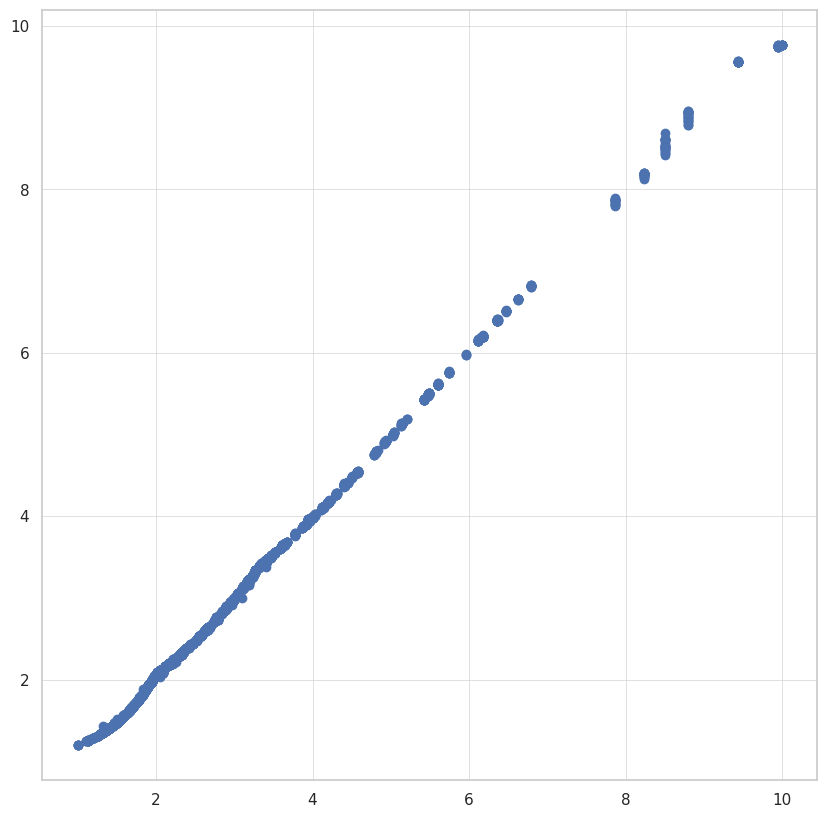

In [268]:
y_pred = scalerY.inverse_transform(model.predict(X_test))
y_truth = scalerY.inverse_transform(y_test)

plt.scatter(y_truth,y_pred)

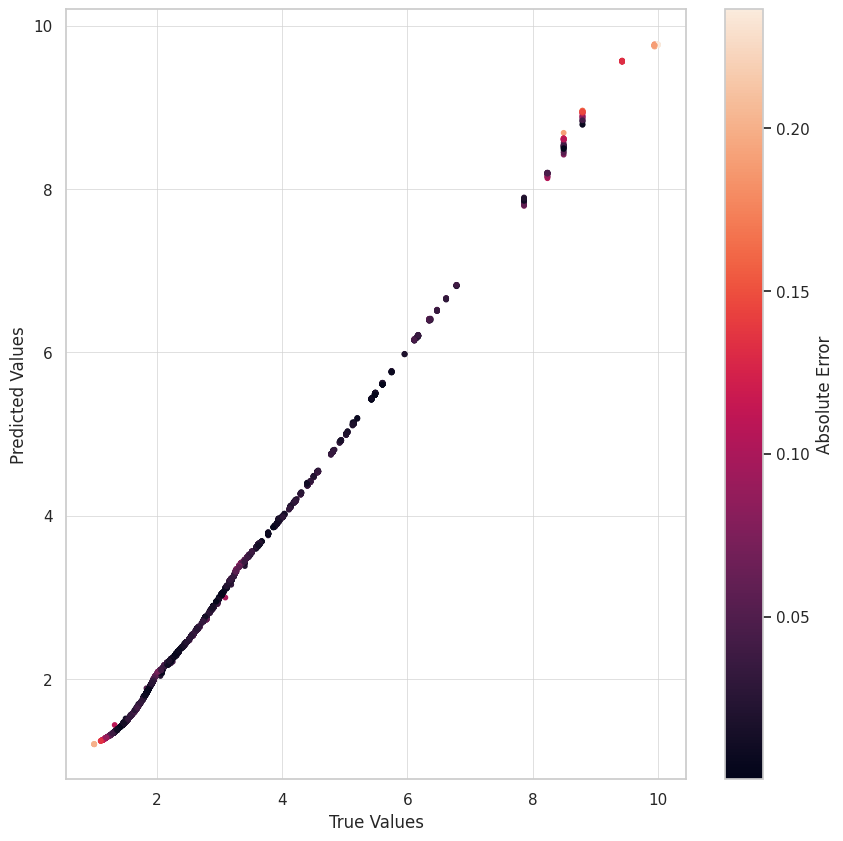

In [269]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate absolute error
error = np.abs(y_pred - y_truth)

# Create scatter plot with smaller dots
plt.scatter(y_truth, y_pred, c=error, s=10)  # Here, s is set to 10. You can adjust this value as needed.

# Add a colorbar to the plot to interpret the colors
plt.colorbar(label='Absolute Error')

plt.xlabel('True Values')
plt.ylabel('Predicted Values')

plt.show()


[ 1.41958433  2.57114613  0.36646142 ... -0.44833817 -0.79040239
 -2.86776944]


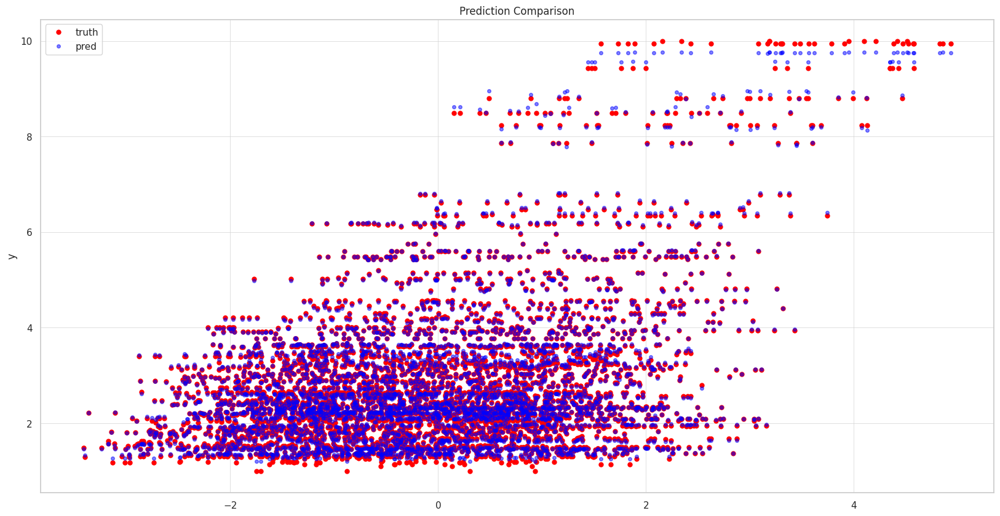

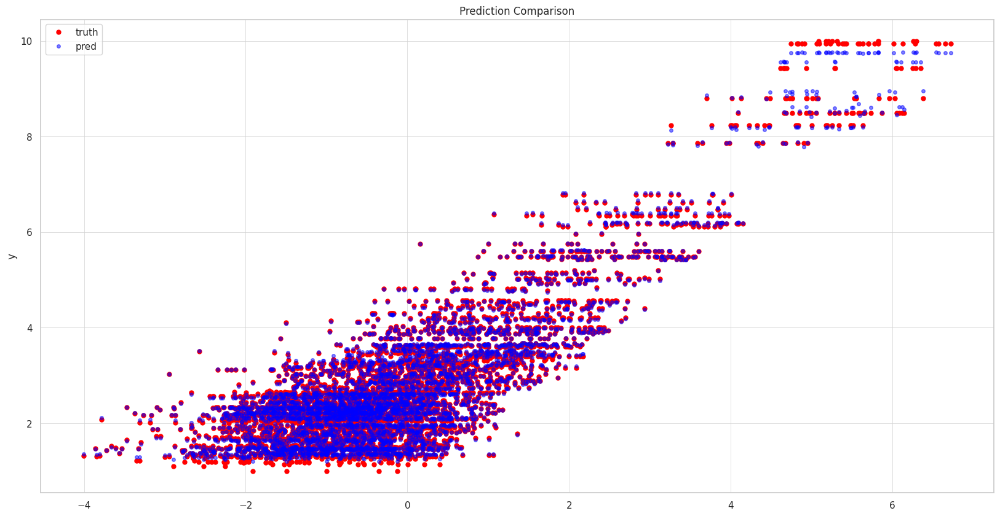

In [270]:
age_test = (scalerX.inverse_transform(X_test)[:,3])
print(age_test)

exp_test = (scalerX.inverse_transform(X_test)[:,2])

plot_comparison(age_test, y_pred, y_truth, "", "y")
plot_comparison(exp_test, y_pred, y_truth,  "", "y")

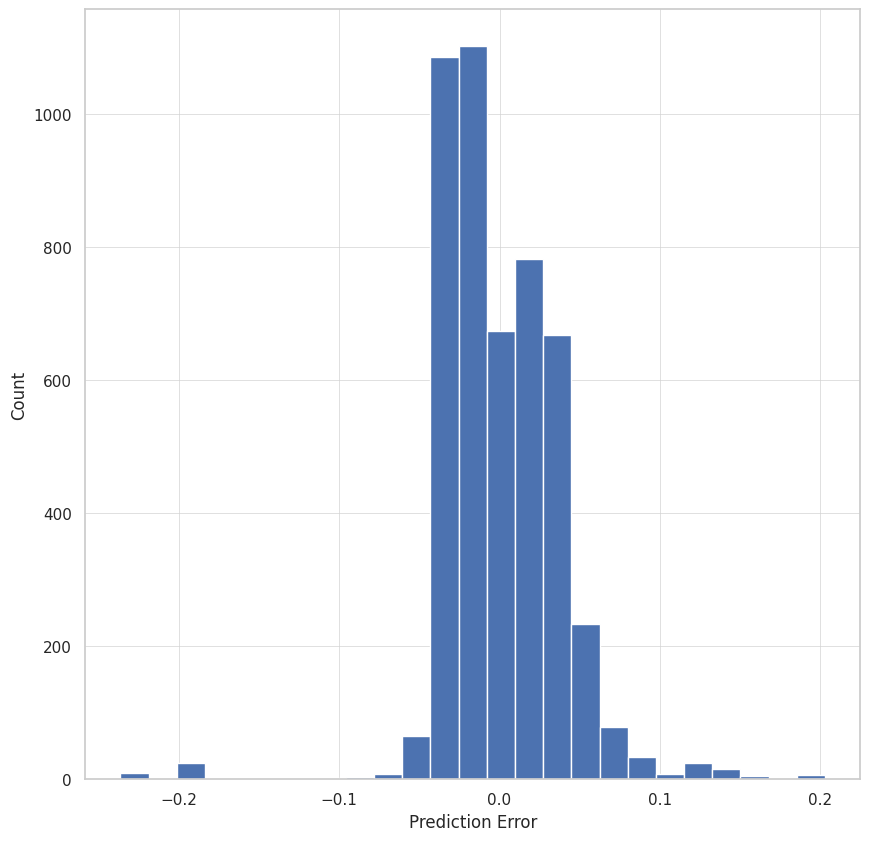

In [271]:
error = y_pred - y_truth
plt.hist(error, bins=25)
plt.xlabel('Prediction Error')
_ = plt.ylabel('Count')

In [228]:
# Import PCA
from sklearn.decomposition import PCA

# Specify the number of components for PCA
pca = PCA(n_components=8)

# Fit and transform the data
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Now you can train your model on the PCA-transformed data
surrogate.fit(X_train_pca, model.predict(X_train_pca))

# Calculate permutation importance using the surrogate model
result = permutation_importance(surrogate, X_test_pca, y_test, n_repeats=10, random_state=42, n_jobs=2)

# Get importance
importance = result.importances_mean

# Summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))


604/604 [==============================] - 1s 2ms/step
Feature: 0, Score: -0.18408
Feature: 1, Score: -0.04802
Feature: 2, Score: -0.01063
Feature: 3, Score: 0.00340
Feature: 4, Score: 0.00543
Feature: 5, Score: -0.00326
Feature: 6, Score: -0.00207
Feature: 7, Score: -0.00170


In [274]:
print(X_train.dtype)
print(y_train.dtype)


AttributeError: ignored

In [ ]:
from sklearn.inspection import permutation_importance

# Train the model
model.fit(X_train, y_train)

# Calculate permutation importance on the validation set
result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2)

# Get importance
importance = result.importances_mean

# Summarize feature importance
for i, v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i, v))


In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.inspection import permutation_importance

# Create a surrogate model
surrogate = DecisionTreeRegressor()

# Fit the surrogate model using the predictions of the original model
surrogate.fit(X_train, model.predict(X_train))

# Calculate permutation importance using the surrogate model
result = permutation_importance(surrogate, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2)

# Get importance
importance = result.importances_mean

# Summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))


# random forest

In [ ]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
# Import necessary library
import numpy as np


# Keep only numerical columns
numerical_cols = data.select_dtypes(include=np.number).columns.tolist()
data = data[numerical_cols]

# Specify your target column
target_col = "weighted_rating"

# Create features (X) and target (y) dataframes
X = data.drop(columns=[target_col])
y = data[target_col]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train a Decision Tree regressor
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)

# Predict on test data
tree_predictions = tree.predict(X_test)

# Print the root mean square error of the Decision Tree model
print("Decision Tree RMSE:", np.sqrt(mean_squared_error(y_test, tree_predictions)))

# Initialize and train a Random Forest regressor
forest = RandomForestRegressor(random_state=42)
forest.fit(X_train, y_train)

# Predict on test data
forest_predictions = forest.predict(X_test)

# Print the root mean square error of the Random Forest model
print("Random Forest RMSE:", np.sqrt(mean_squared_error(y_test, forest_predictions)))


Decision Tree RMSE: 0.22985661512260608
Random Forest RMSE: 0.1638575474233907


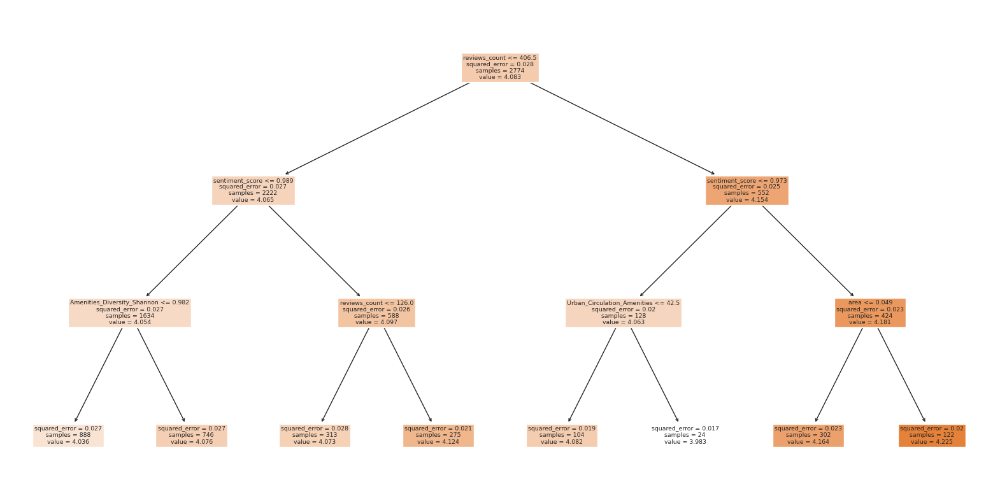

In [ ]:
# Import necessary libraries
from sklearn.tree import DecisionTreeRegressor, plot_tree
import matplotlib.pyplot as plt

# Separate the features and the target variable
X = data_num.drop('weighted_rating', axis=1)
y = data_num['weighted_rating']

# Train the decision tree regressor
dtree = DecisionTreeRegressor(max_depth=3)
dtree.fit(X, y)

# Plot the decision tree
plt.figure(figsize=(20,10))
plot_tree(dtree, feature_names=X.columns, filled=True)
plt.show()


<ipython-input-221-076f685cca98>:20: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(X_train, y_train)


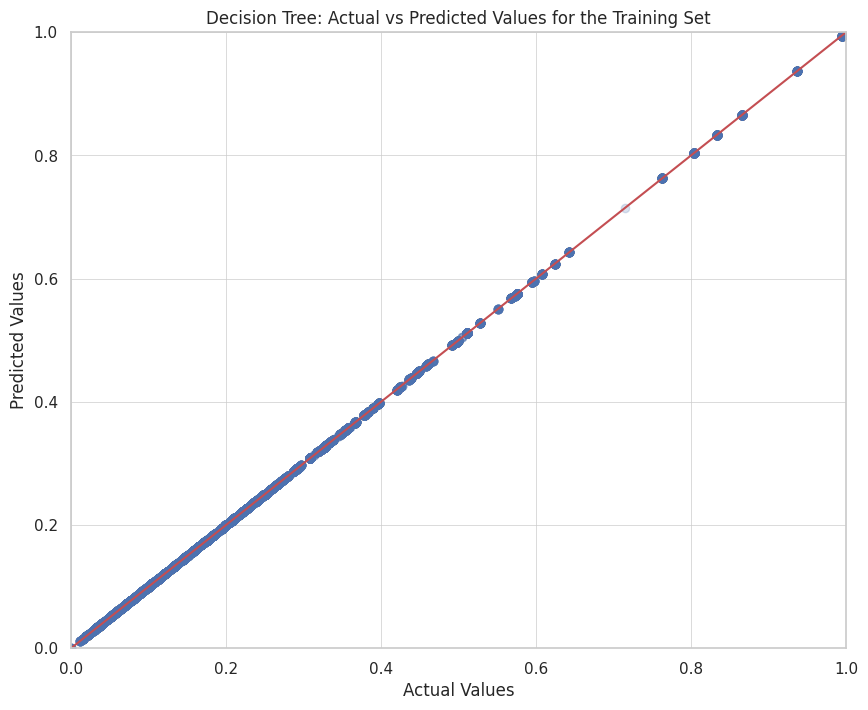

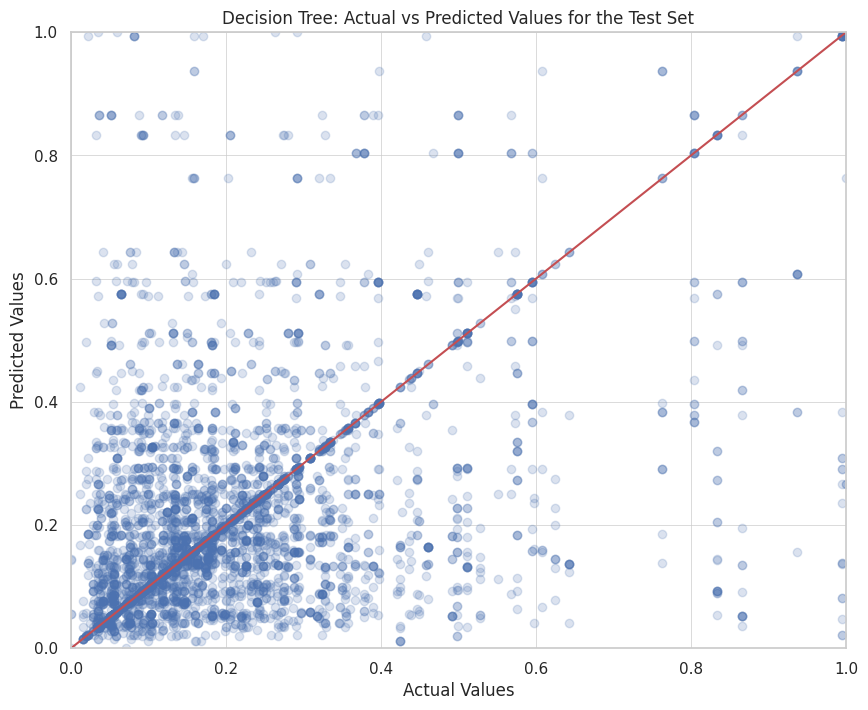

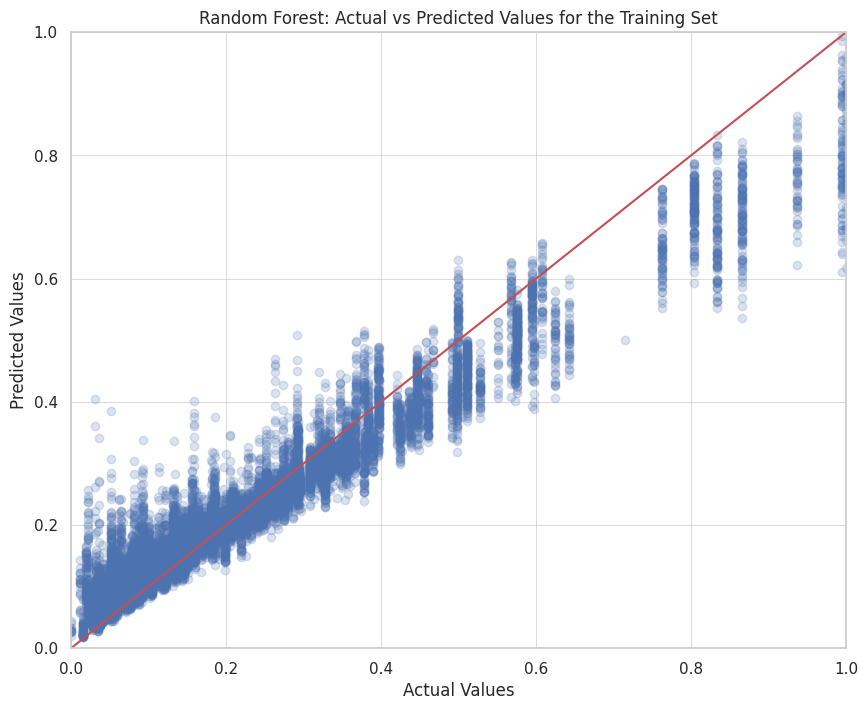

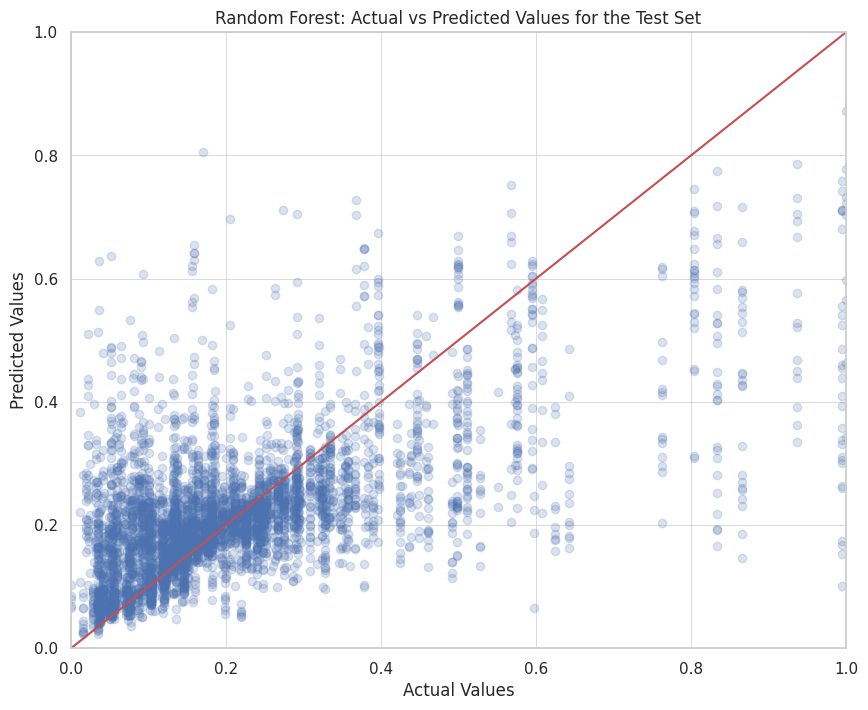

In [221]:
# Import necessary libraries
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Train the Decision Tree model
dt = DecisionTreeRegressor(random_state=42)
dt.fit(X_train, y_train)

# Predict with the Decision Tree model on the training set
y_train_pred_dt = dt.predict(X_train)

# Predict with the Decision Tree model on the test set
y_test_pred_dt = dt.predict(X_test)

# Train the Random Forest model
rf = RandomForestRegressor(random_state=42)
rf.fit(X_train, y_train)

# Predict with the Random Forest model on the training set
y_train_pred_rf = rf.predict(X_train)

# Predict with the Random Forest model on the test set
y_test_pred_rf = rf.predict(X_test)

# Decision Tree plots
plt.figure(figsize=(10, 8))
plt.scatter(y_train, y_train_pred_dt, alpha=0.2)
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'r')
plt.xlim([min(y_train), max(y_train)])
plt.ylim([min(y_train), max(y_train)])
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Decision Tree: Actual vs Predicted Values for the Training Set')
plt.show()

plt.figure(figsize=(10, 8))
plt.scatter(y_test, y_test_pred_dt, alpha=0.2)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r')
plt.xlim([min(y_test), max(y_test)])
plt.ylim([min(y_test), max(y_test)])
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Decision Tree: Actual vs Predicted Values for the Test Set')
plt.show()

# Random Forest plots
plt.figure(figsize=(10, 8))
plt.scatter(y_train, y_train_pred_rf, alpha=0.2)
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'r')
plt.xlim([min(y_train), max(y_train)])
plt.ylim([min(y_train), max(y_train)])
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Random Forest: Actual vs Predicted Values for the Training Set')
plt.show()

plt.figure(figsize=(10, 8))
plt.scatter(y_test, y_test_pred_rf, alpha=0.2)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r')
plt.xlim([min(y_test), max(y_test)])
plt.ylim([min(y_test), max(y_test)])
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Random Forest: Actual vs Predicted Values for the Test Set')
plt.show()


# kmeans

In [ ]:
import pandas as pd

file_path = '/content/drive/MyDrive/Data - Encoding - Group/ALL_PARKS_TRAINING_5.csv'  # replace with your file path
data = pd.read_csv(file_path)


In [277]:
# Keep only numerical columns
numerical_cols = data.select_dtypes(include=[np.number]).columns.tolist()
data_num = data[numerical_cols]

# Import necessary libraries
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Perform K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(data_num)

# Create labels
labels = kmeans.labels_

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data_num, labels, test_size=0.2, random_state=42)

# Train a random forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Predict the labels for the testing data
y_pred = clf.predict(X_test)

# Print the accuracy of the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Accuracy: 0.9973084886128364


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


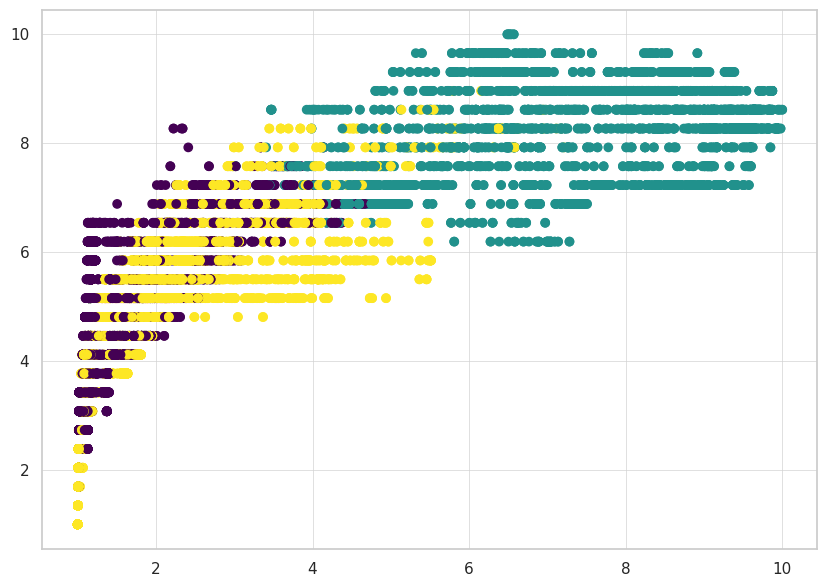

In [278]:
import matplotlib.pyplot as plt

# Fit the KMeans model to the data and predict the cluster assignments for each data point
km = KMeans(n_clusters=3, random_state=42)
data_num['Cluster'] = km.fit_predict(data_num)

# Plot the data colored by the KMeans cluster assignments
plt.figure(figsize=(10, 7))
plt.scatter(data_num.iloc[:, 0], data_num.iloc[:, 1], c=data_num['Cluster'], cmap='viridis')

# Display the plot
plt.show()


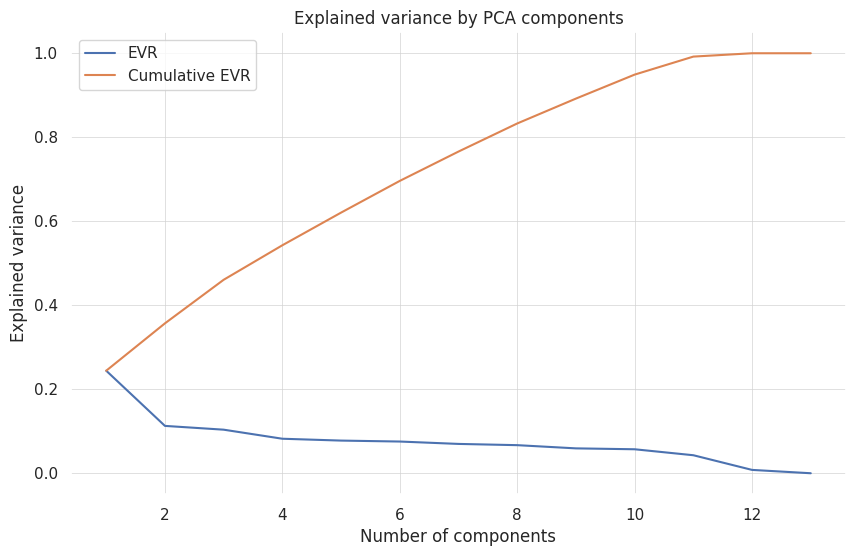

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


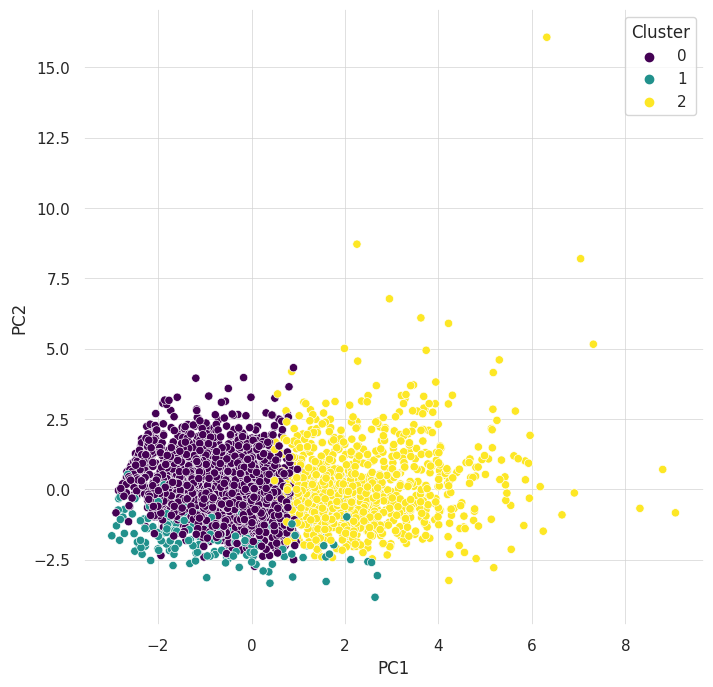

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns



# Standardizing the features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_num)

# Perform PCA
pca = PCA()
principalComponents = pca.fit_transform(data_scaled)
pcscores = pd.DataFrame(principalComponents, columns=['PC'+str(i) for i in range(1, len(pca.explained_variance_)+1)])

# Plot the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_)+1), pca.explained_variance_ratio_, label='EVR')
plt.plot(range(1, len(pca.explained_variance_)+1), np.cumsum(pca.explained_variance_ratio_), label='Cumulative EVR')
plt.title('Explained variance by PCA components')
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.grid(True)
plt.legend()
plt.show()

# Perform k-means clustering on the filtered dataframe
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(pcscores)

# Add the labels to the dataframe
pcscores['Cluster'] = kmeans.labels_

# Plotting the clusters
plt.figure(figsize=(8, 8))
sns.scatterplot(data=pcscores, x='PC1', y='PC2', hue='Cluster', palette='viridis')
plt.show()


In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# Select rows that fall in the 50% quintile based on 'reviews_count'
lower, upper = data['reviews_count'].quantile([0.25, 0.75])
data_filtered = data[(data['reviews_count'] >= lower) & (data['reviews_count'] <= upper)]

# Keep only numerical columns
numerical_cols = data_filtered.select_dtypes(include=[np.number]).columns.tolist()
data_num = data_filtered[numerical_cols]

# Perform K-means clustering
kmeans = KMeans(n_clusters=12, random_state=42)
kmeans.fit(data_num)

# Create labels
labels = kmeans.labels_

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data_num, labels, test_size=0.5, random_state=42)

# Train a random forest classifier
clf = RandomForestClassifier(n_estimators=10000, random_state=42)
clf.fit(X_train, y_train)

# Predict the labels for the testing data
y_pred = clf.predict(X_test)

# Print the accuracy of the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))

# Fit the KMeans model to the data and predict the cluster assignments for each data point
km = KMeans(n_clusters=3, random_state=42)
data_num['Cluster'] = km.fit_predict(data_num)

# Plot the data colored by the KMeans cluster assignments
plt.figure(figsize=(10, 7))
plt.scatter(data_num.iloc[:, 0], data_num.iloc[:, 1], c=data_num['Cluster'], cmap='viridis')

# Display the plot
plt.show()


# tsne

In [ ]:
!pip install umap-learn


In [230]:
import pandas as pd

# Define the file path
file_path = '/content/drive/MyDrive/Session CSVs/pcscores_studio_proper'

# Read the file into a pandas DataFrame
data = pd.read_csv(file_path)


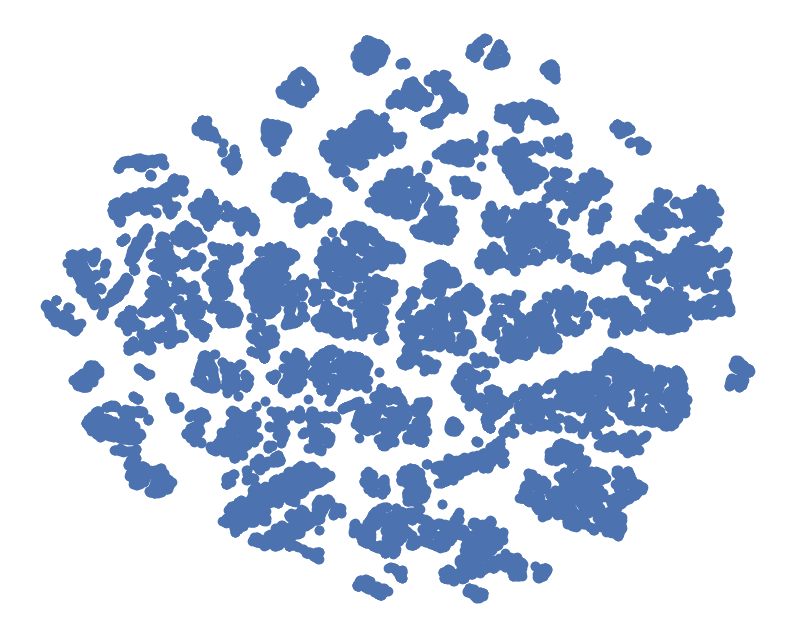

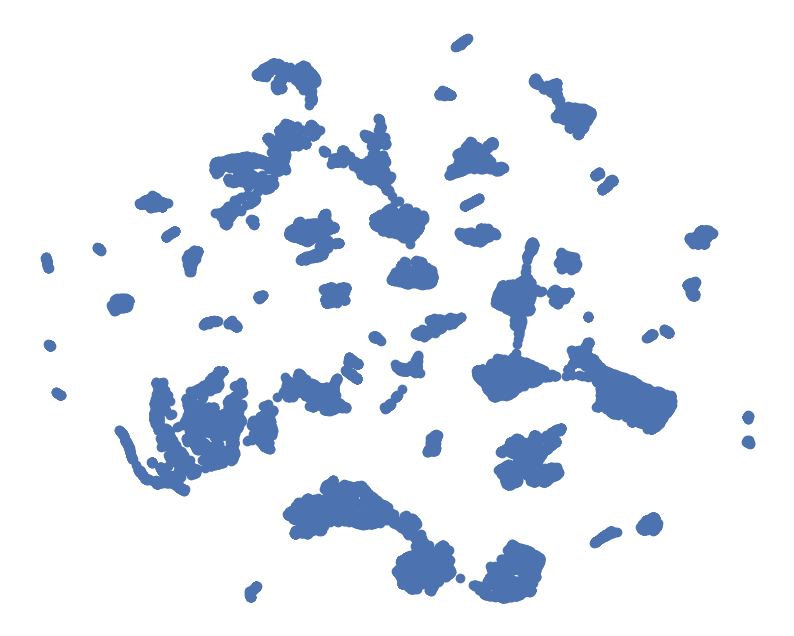

In [280]:
# Import required libraries
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
# Select only numerical columns
data_num = data.select_dtypes(include=np.number)

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_num)

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(data_scaled)

# Plot t-SNE results
plt.figure(figsize=(10,8))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# Apply UMAP
umap = UMAP(n_components=2, random_state=42)
umap_results = umap.fit_transform(data_scaled)

# Plot UMAP results
plt.figure(figsize=(10,8))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


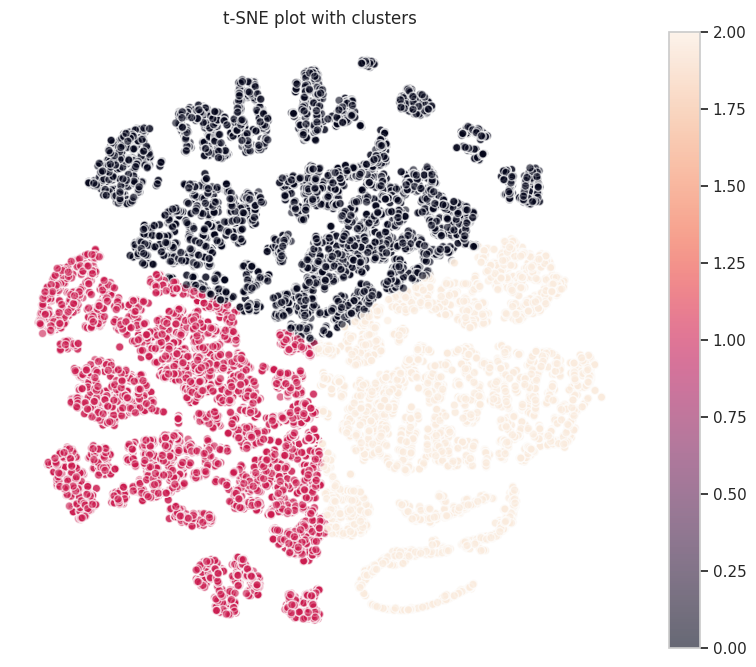

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


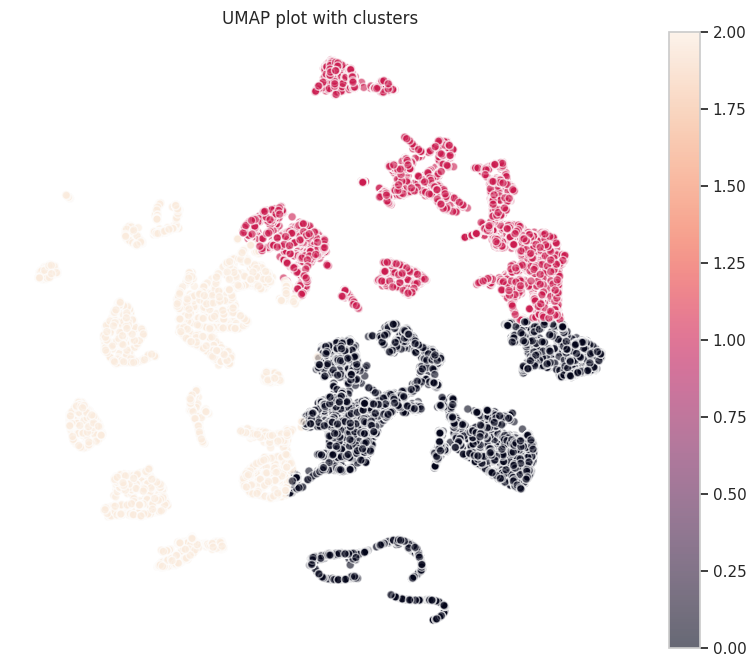

In [232]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Adjust plot style
plt.rcParams['axes.facecolor'] = 'white' # makes the background white
plt.rcParams['grid.color'] = 'lightgrey' # makes gridlines light grey
plt.rcParams['grid.linestyle'] = '-' # defines the style of the gridlines
plt.rcParams['grid.linewidth'] = 0.5 # defines the width of the gridlines

def plot_with_clusters(data, title):
    # Perform k-means clustering. Here, I am assuming 3 clusters.
    # You should change this to suit your data.
    kmeans = KMeans(n_clusters=3)
    kmeans.fit(data)

    # Use the cluster labels as colors
    plt.figure(figsize=(10,8))
    scatter = plt.scatter(data[:, 0], data[:, 1], c=kmeans.labels_, alpha=0.6, edgecolors='w')

    plt.title(title, fontsize=12)
    plt.colorbar(scatter)
    plt.grid(True)  # Add gridlines
    plt.xticks([])  # Remove x-axis values
    plt.yticks([])  # Remove y-axis values
    plt.axis('off')
    plt.show()

# Now we apply the function to our t-SNE and UMAP results

# t-SNE plot
plot_with_clusters(tsne_results, 't-SNE plot with clusters')

# UMAP plot
plot_with_clusters(umap_results, 'UMAP plot with clusters')


In [233]:
from sklearn.cluster import KMeans

# Create a KMeans object with the desired number of clusters
kmeans = KMeans(n_clusters=3)

# Perform clustering on the t-SNE results
kmeans.fit(tsne_results)

# Add the cluster labels back to the original DataFrame
data['cluster'] = kmeans.labels_

# Check the DataFrame
print(data.head())


          0         1         2         3         4         5         6  \
0  2.154209 -0.105092  0.319534 -0.497169  0.188951 -0.172653  0.019727   
1  2.473799 -0.090879 -0.650020 -0.287304  0.070781 -0.177572  0.025961   
2  3.994134  2.225933 -0.267363 -0.126476  0.838472 -0.015686  0.301958   
3  3.269046  2.186608  1.929904 -0.547902  1.114529 -0.004978  0.289713   
4  3.784687  2.390921  0.594993 -0.281424  0.934935 -0.006978  0.291689   

          7  cluster  
0  0.002728        2  
1  0.005247        0  
2 -0.082677        2  
3 -0.089380        2  
4 -0.084184        2  


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [139]:
# Get rows associated with Cluster 1
cluster_1_data = data[data['cluster'] == 1]

# Print rows associated with Cluster 1
cluster_1_data


,0,1,2,3,4,5,6,7,8,cluster
1,2.548474,-0.106203,0.069769,-0.702823,-0.369584,0.133905,-0.186231,0.036123,0.002454,1
5,6.500976,-2.828212,-0.611205,0.287850,0.679509,-0.021294,-0.188416,-0.050795,-0.004258,1
6,6.572809,-2.800003,-0.357939,0.100473,0.749220,-0.067130,-0.188011,-0.050890,-0.002988,1
13,-0.776420,-0.181896,0.969420,1.346100,-1.250582,0.507642,-0.042687,0.177630,-0.066757,1
26,0.221055,-1.356163,0.741134,-2.610854,0.674863,1.520807,0.472664,-0.151919,0.056018,1
...,...,...,...,...,...,...,...,...,...,...
24140,-2.787579,-1.044773,0.226939,0.327775,-1.217718,-0.391432,1.147964,-0.556955,-0.037464,1
24141,-2.610026,-0.996480,0.570317,-0.297423,-1.103564,-0.443440,1.085434,-0.500665,-0.031920,1
24142,-2.534159,-0.952595,0.750986,-0.631887,-1.041129,-0.508933,0.692106,-0.379486,-0.020512,1
24143,0.391580,-0.258946,1.077500,-1.056970,0.991753,1.591417,-0.341657,-0.101934,0.012339,1


In [140]:
# Get rows associated with Cluster 1
cluster_2_data = data[data['cluster'] == 2]

# Print rows associated with Cluster 1
cluster_2_data

,0,1,2,3,4,5,6,7,8,cluster
0,2.280158,-0.181769,-0.665053,0.011161,-0.583351,0.276105,-0.185425,0.034121,-0.001235,2
2,4.014485,2.246660,-0.067211,-0.305854,-0.126776,0.869023,-0.022849,0.310588,-0.085832,2
3,3.306229,2.160503,-1.155810,1.628699,-0.447944,1.132295,-0.011616,0.297497,-0.092258,2
4,3.809476,2.393465,-0.510022,0.446604,-0.244300,0.960577,-0.013931,0.299939,-0.087207,2
10,-1.950309,-0.624962,0.822379,0.362801,0.010504,-0.200065,-0.059891,-0.045390,-0.021251,2
...,...,...,...,...,...,...,...,...,...,...
24117,-4.244290,-0.652949,-0.334286,-0.343588,-0.722311,-2.260724,0.197752,-0.075113,-0.019942,2
24120,-3.511446,-0.110250,5.472746,3.820526,0.924454,-0.397137,0.001463,-0.121443,0.057429,2
24121,0.495682,3.137508,-2.168040,0.554709,-1.225146,0.524683,0.151610,0.313728,-0.088017,2
24126,5.469053,-0.975748,0.294795,0.887408,-0.123770,-1.495797,-0.153113,-0.079373,0.029105,2


In [141]:
# Get rows associated with Cluster 1
cluster_3_data = data[data['cluster'] == 0]

# Print rows associated with Cluster 1
cluster_3_data

,0,1,2,3,4,5,6,7,8,cluster
7,-1.865250,-1.262238,-0.184770,-1.510115,2.798729,0.378855,-0.188148,0.033220,-0.042482,0
8,-1.662281,-1.227227,0.214115,-2.060671,2.925781,0.292850,-0.190480,0.036486,-0.040474,0
9,-1.837944,-0.893198,-1.347582,-0.051370,-0.851886,0.045359,-0.085697,-0.029300,-0.025219,0
11,-2.481905,-1.236448,-1.288719,0.449389,2.445813,0.595397,-0.169686,0.017734,-0.042920,0
12,-2.501740,-0.733938,0.153910,0.899821,0.343823,0.189103,-0.142903,-0.073171,0.005112,0
...,...,...,...,...,...,...,...,...,...,...
24136,-3.375864,-1.154684,0.293079,0.177891,2.866908,-0.683595,0.002374,0.018376,-0.063025,0
24137,-3.168423,-1.423695,-1.014922,-0.626315,2.612326,-0.523704,-0.021699,0.047927,-0.077407,0
24138,-2.038179,-1.476888,-1.176859,-0.225767,-0.786997,0.504210,-0.222319,-0.066300,-0.005308,0
24144,-3.576905,-1.209950,-0.380241,0.724461,2.681607,-0.560177,0.003136,0.019162,-0.062364,0


In [ ]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# Drop the unneeded columns
cluster_1_data = cluster_1_data.drop(columns=["city", "park_name", "cluster"])

# Calculate the means for each column
cluster_1_means = pd.DataFrame(cluster_1_data.mean(), columns=["mean"]).T

# Apply the scaler to all columns
scaler = MinMaxScaler(feature_range=(0, 10))  # range to scale to
cluster_1_means_scaled = scaler.fit_transform(cluster_1_means)

# Convert scaled array back to DataFrame
cluster_1_means_scaled = pd.DataFrame(cluster_1_means_scaled, columns=cluster_1_means.columns)

# Now, you can plot the radar plot with `cluster_1_means_scaled`


In [ ]:
# Save DataFrame to CSV
cluster_1_data.to_csv("/content/drive/MyDrive/Data - Encoding - Group/cluster_1_data.csv", index=False)
cluster_2_data.to_csv("/content/drive/MyDrive/Data - Encoding - Group/cluster_2_data.csv", index=False)
cluster_3_data.to_csv("/content/drive/MyDrive/Data - Encoding - Group/cluster_0_data.csv", index=False)


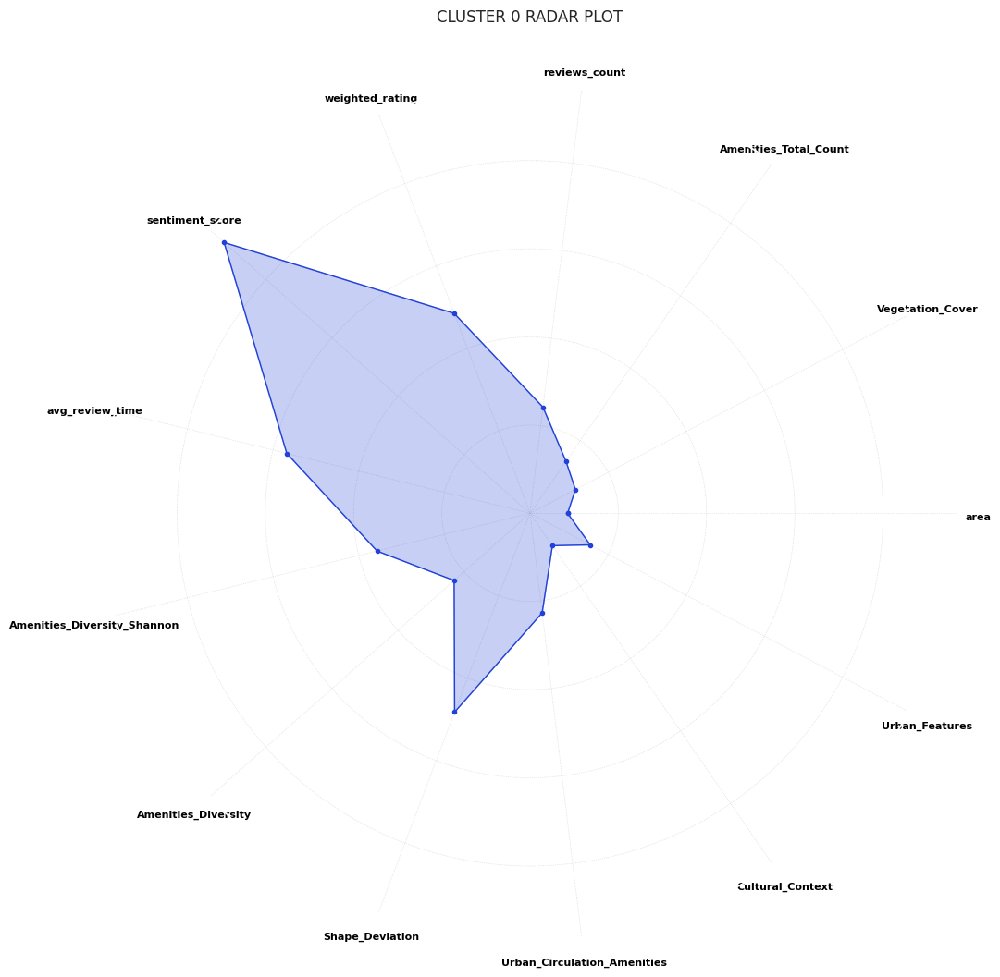

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Your DataFrame name
df = cluster_3_data

# Drop unnecessary columns
df = df.drop(columns=['city', 'park_name', 'cluster'])

# Scale the DataFrame values between 0 to 10
scaler = MinMaxScaler(feature_range=(0, 10))
df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Compute the mean of each column
means = df_scaled.mean()

# Convert it to list for plotting
values = means.tolist()
values += values[:1]  # repeat the first value to close the circular graph

# Compute angle for each axis in the plot (divide the plot / number of variable)
angles = [n / float(len(means)) * 2 * np.pi for n in range(len(means))]
angles += angles[:1]  # repeat the first angle to close the circular graph

# Plot
fig1, ax1 = plt.subplots(figsize=(12, 12), subplot_kw=dict(polar=True))

color = np.random.rand(3,)  # Generate a random color
ax1.fill(angles, values, color=color, alpha=0.25)
ax1.plot(angles, values, color=color, linewidth=1, linestyle='solid', marker='o', markersize=3)  # added marker 'o' with size 3
ax1.set_title('Cluster 0 Radar plot'.upper(), pad=50, loc='center', fontsize=12)  # Moved title up with pad=50
ax1.set_xticks(angles[:-1])
ax1.set_xticklabels(df.columns, color='black', size=8, horizontalalignment='center', verticalalignment='top', fontweight='bold')  # Offset the labels with horizontalalignment='center'
ax1.set_yticklabels([])
ax1.grid(linestyle='dotted')
ax1.set_rlabel_position(0)

plt.show()


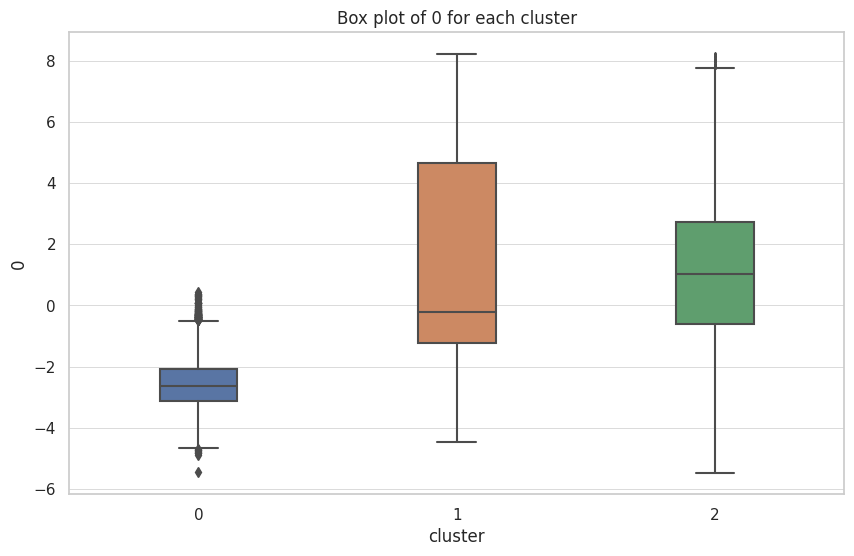

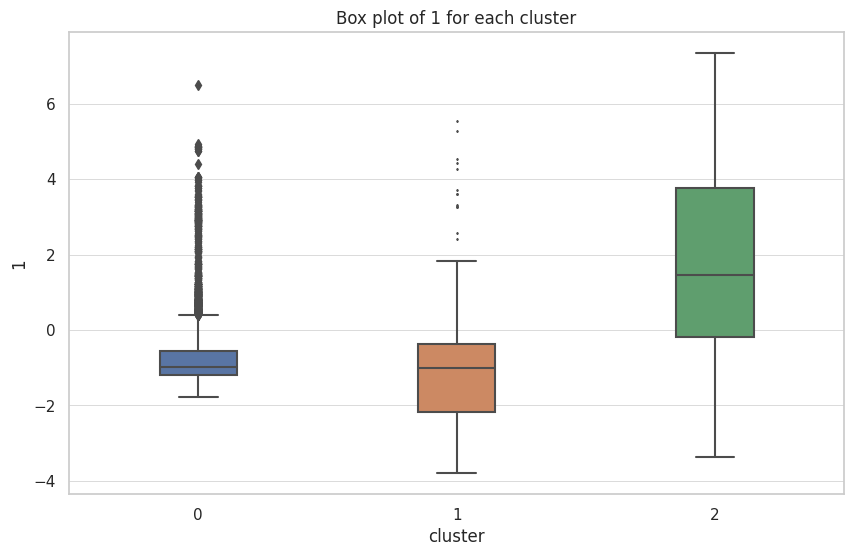

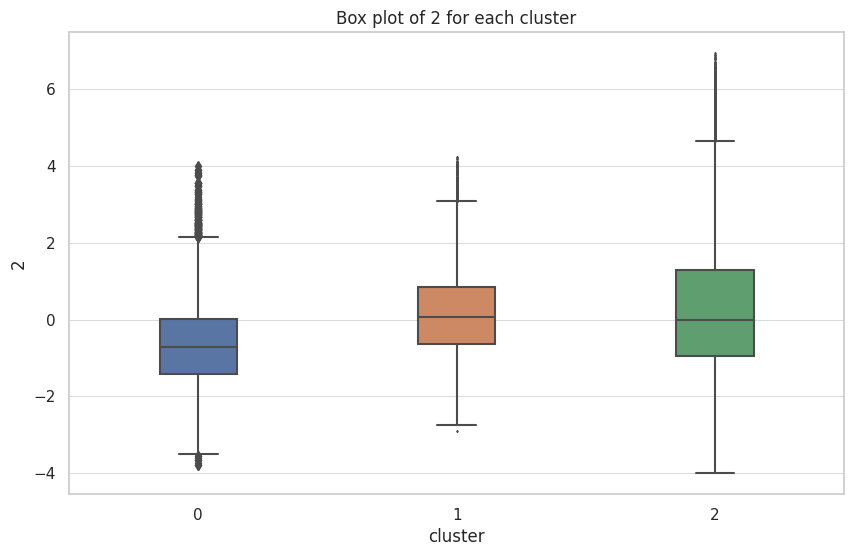

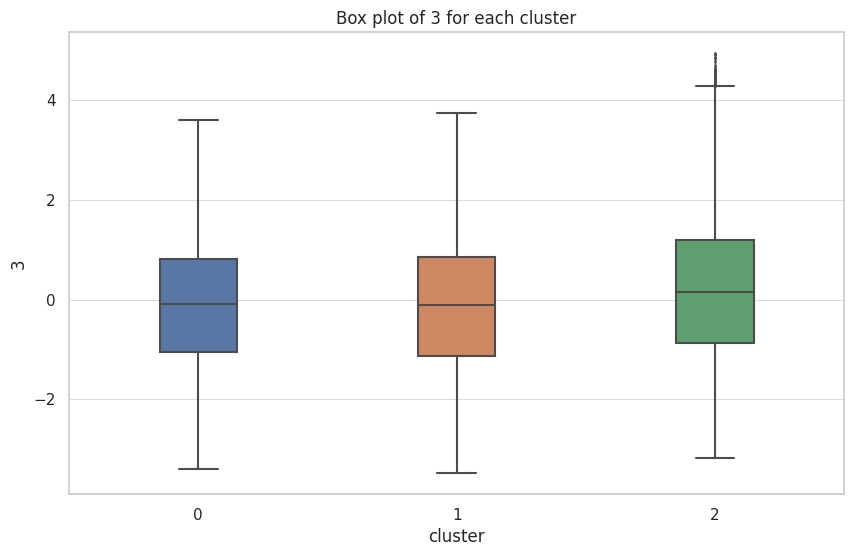

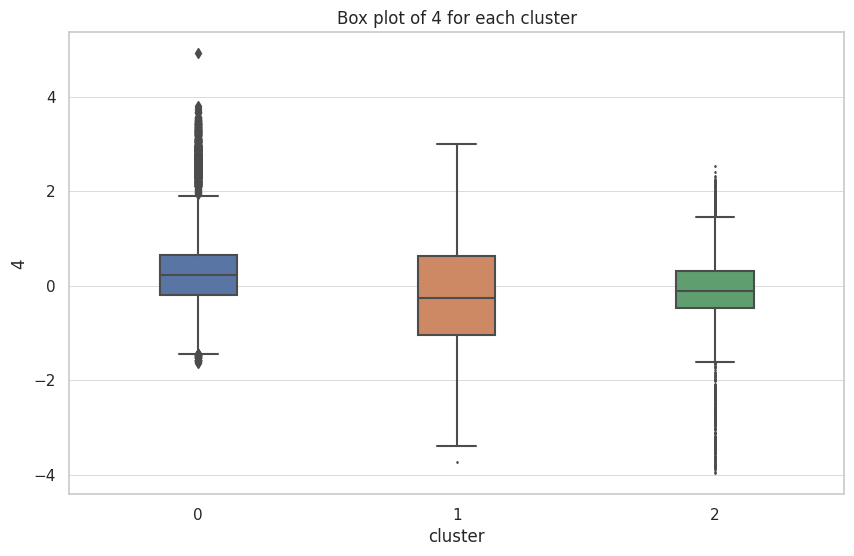

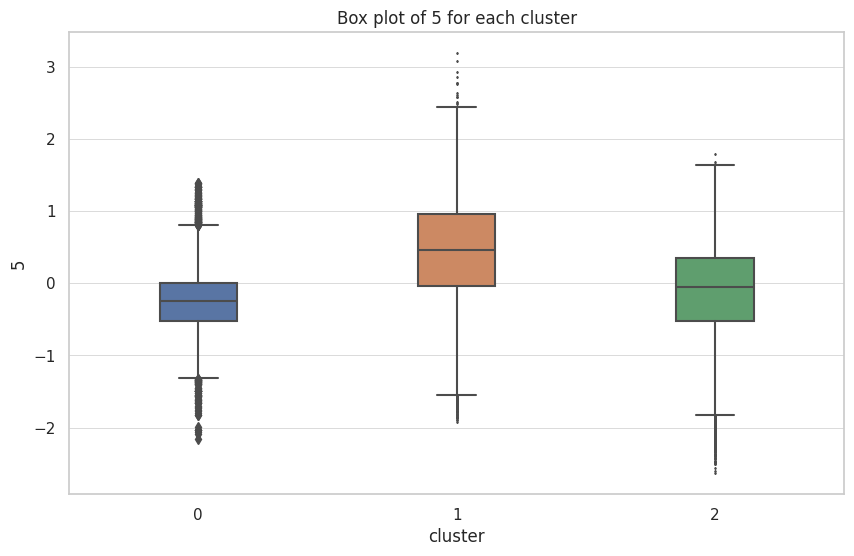

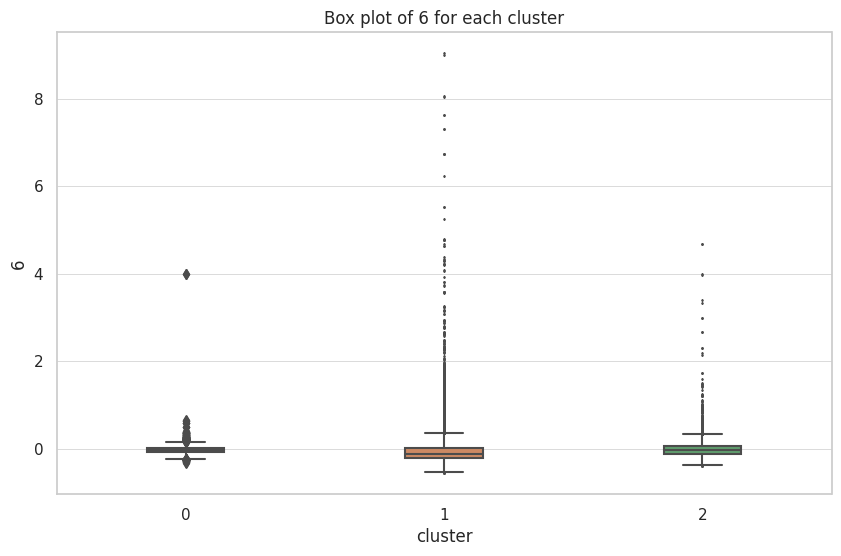

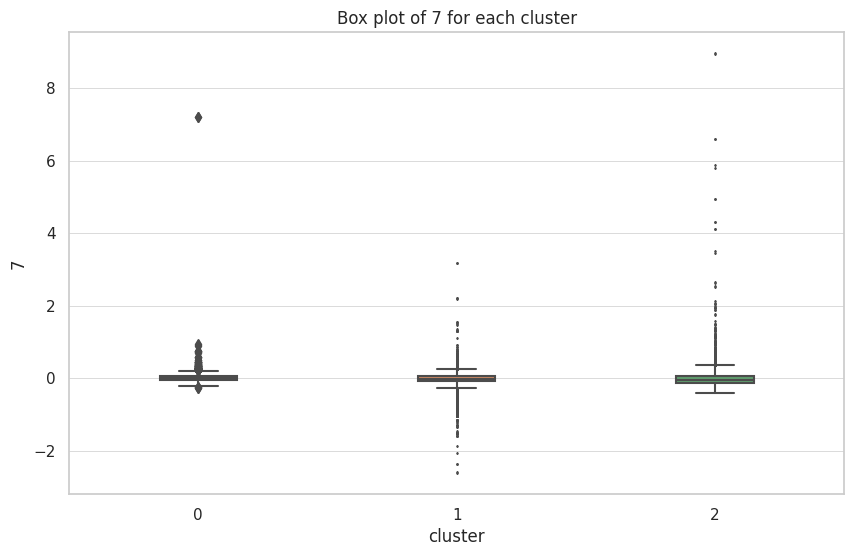

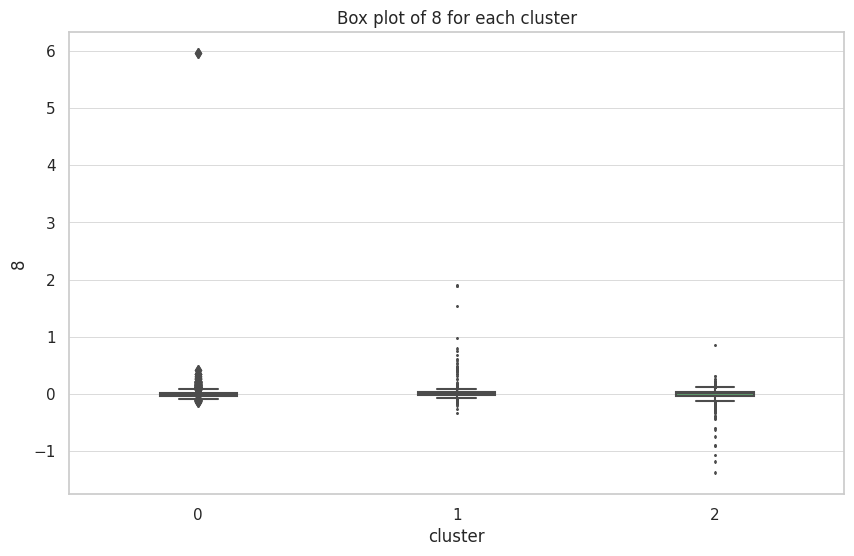

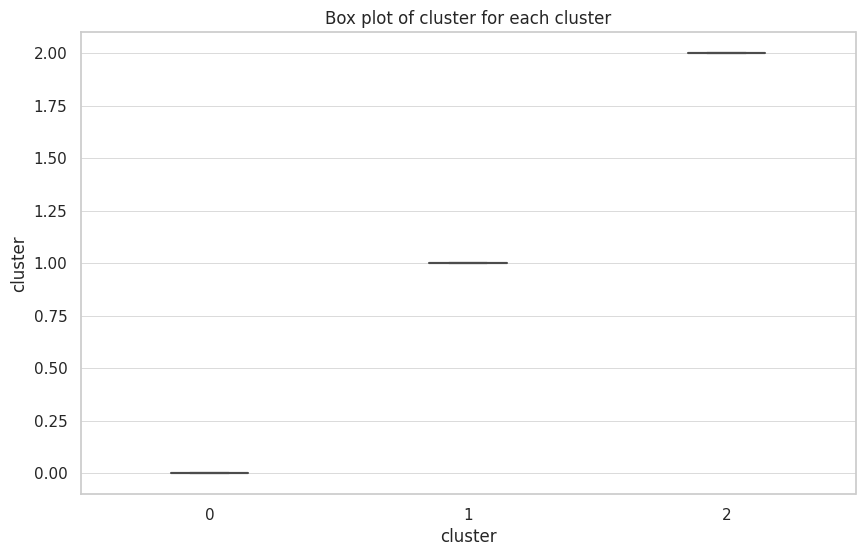

In [150]:
import seaborn as sns

# Suppose features is a list of your feature names
features = data_num.columns

# Set the style and color palette
sns.set_style("whitegrid")
palette = sns.color_palette("deep", 3)  # We have 3 clusters

# Marker size for the outliers
fliersize = 1

for feature in features:
    fig, ax = plt.subplots(figsize=(10,6))

    # Create a boxplot for each feature, stratified by cluster
    box_plot = sns.boxplot(x='cluster', y=feature, data=data, ax=ax, palette=palette, width=0.3)

    # Get the underlying matplotlib boxplot object
    for flier in box_plot.get_lines()[len(box_plot.get_lines())//2:]:
        # Adjust the size of the flier markers (outliers)
        flier.set_markersize(fliersize)

    plt.title(f'Box plot of {feature} for each cluster')
    plt.show()


In [144]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(data_num) # Here, data_num should be the data you want to cluster
data_num['cluster'] = kmeans.labels_  # add the cluster labels to the DataFrame


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


                0         1         2         3         4         5         6  \
cluster                                                                         
0        0.424085  1.859584 -0.223883  0.029031  0.148999  0.073780  0.090798   
1       -0.572552 -0.305717  0.108056 -0.084906 -0.069878  0.062768 -0.044333   
2        1.844449 -0.842731 -0.187124  0.311411  0.116290 -0.336797  0.077953   

                7         8  
cluster                      
0       -0.033220 -0.069180  
1        0.015953  0.007492  
2       -0.027442  0.047073  


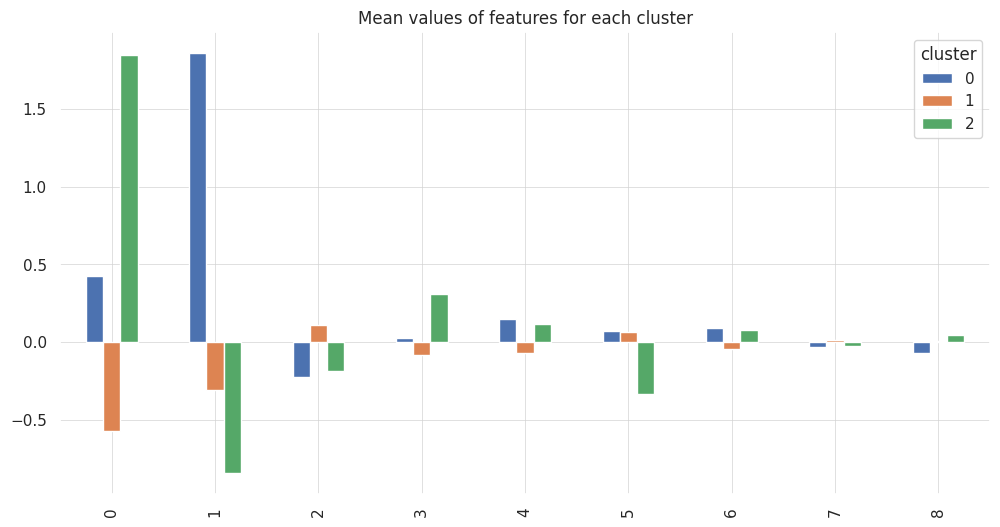

                0         1         2         3         4         5         6  \
cluster                                                                         
0        0.439976  1.775983 -0.333789  0.008271  0.039572  0.106665 -0.018323   
1       -0.621528 -0.339382 -0.071168 -0.104157  0.002759 -0.027611 -0.148834   
2        1.928267 -1.054619 -0.212795  0.309757  0.040920 -0.275119 -0.307341   

                7         8  
cluster                      
0       -0.372597  0.098351  
1       -0.004745 -0.057474  
2       -0.103585  0.135262  


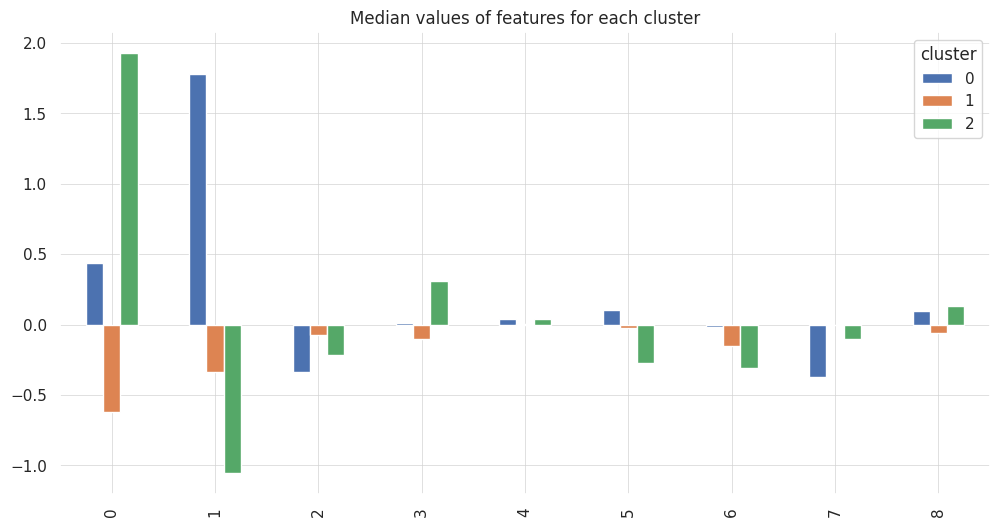

           0         1         2         3         4         5         6  \
0   3.971439  8.037817 -0.535403  0.052457  0.141246  0.041501  0.012369   
1  -5.361795 -1.321422  0.258409 -0.153419 -0.066242  0.035306 -0.006039   
2  17.272773 -3.642598 -0.447496  0.562696  0.110238 -0.189444  0.010619   

          7         8  
0 -0.001923 -0.000486  
1  0.000923  0.000053  
2 -0.001589  0.000330  


In [145]:
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
data_num_std = pd.DataFrame(scaler.fit_transform(data_num.drop(columns=['cluster'])), columns=data_num.columns[:-1])
data_num_std['cluster'] = data_num['cluster']  # add back the cluster labels

# Group by the cluster label and take the mean for each group (i.e., each cluster)
cluster_means = data_num_std.groupby('cluster').mean()

# Print and plot the means across clusters
print(cluster_means)
cluster_means.T.plot(kind='bar', figsize=(12,6))
plt.title('Mean values of features for each cluster')
plt.show()

# Do the same for medians
cluster_medians = data_num_std.groupby('cluster').median()
print(cluster_medians)
cluster_medians.T.plot(kind='bar', figsize=(12,6))
plt.title('Median values of features for each cluster')
plt.show()

# Get the centroids in the original feature space
centroids = scaler.inverse_transform(kmeans.cluster_centers_)
centroids_df = pd.DataFrame(centroids, columns=data_num.columns[:-1])
print(centroids_df)


In [ ]:
import seaborn as sns

# Assume data is your original dataframe and labels are the clusters obtained from K-means
data['cluster'] = kmeans.labels_

# Pairplot
sns.pairplot(data, hue='cluster')

# Mean/Median of features across clusters
cluster_summary = data.groupby('cluster').mean()


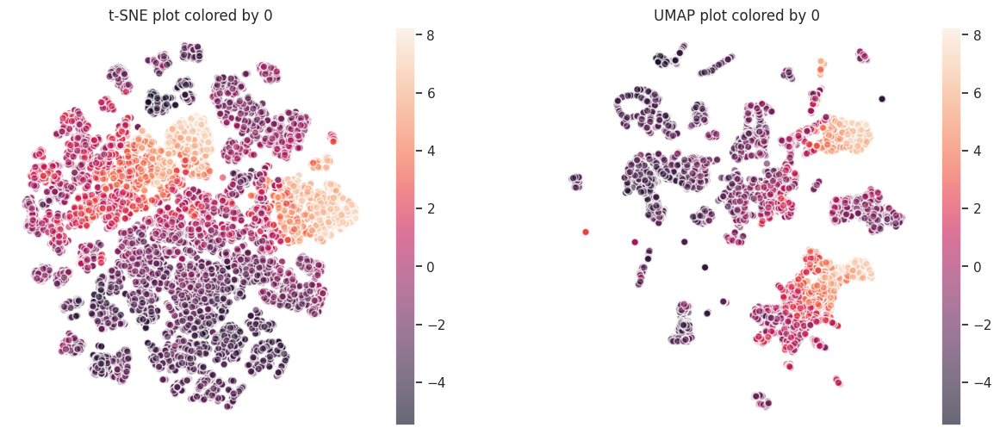

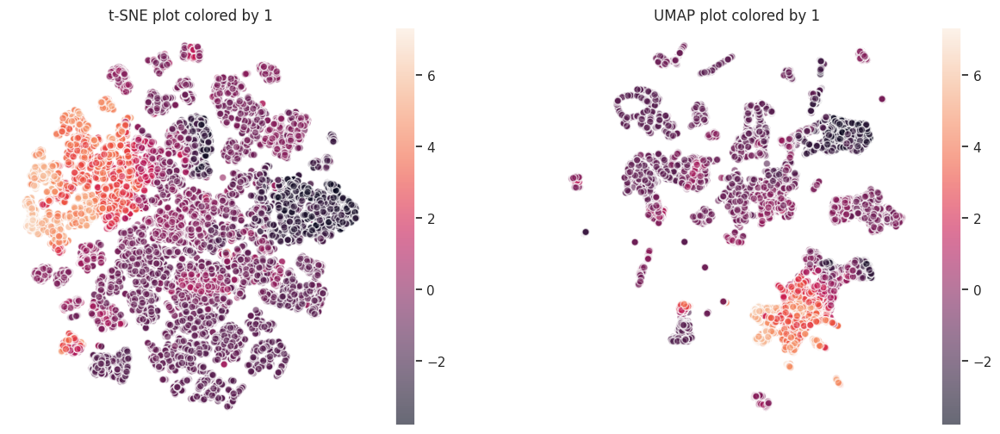

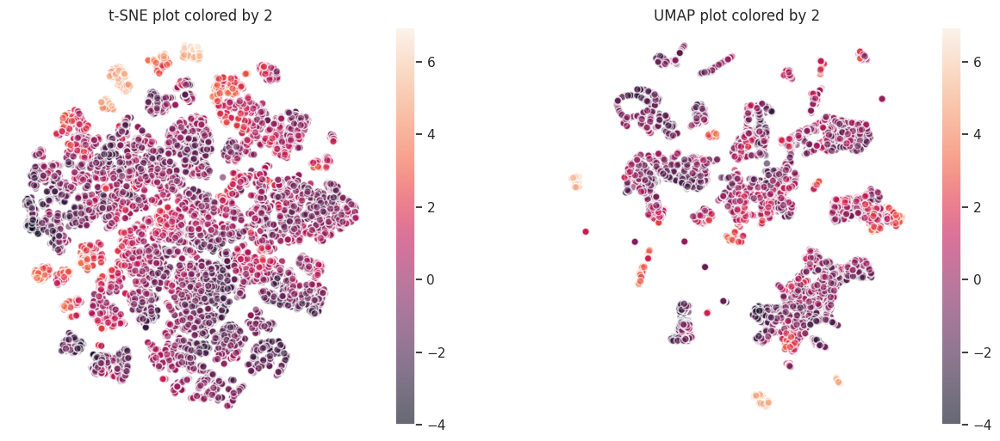

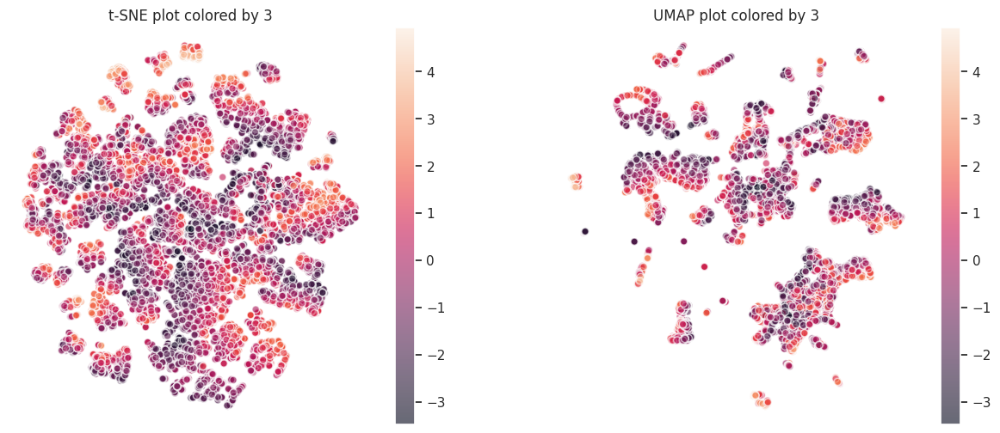

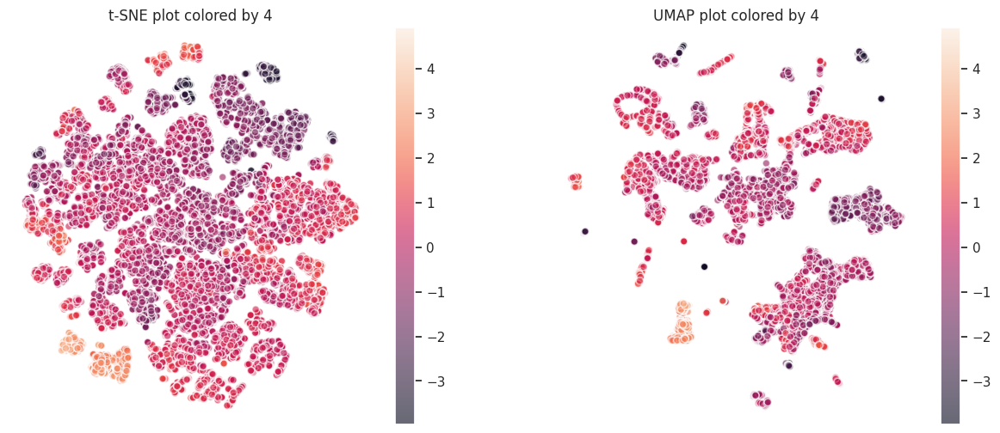

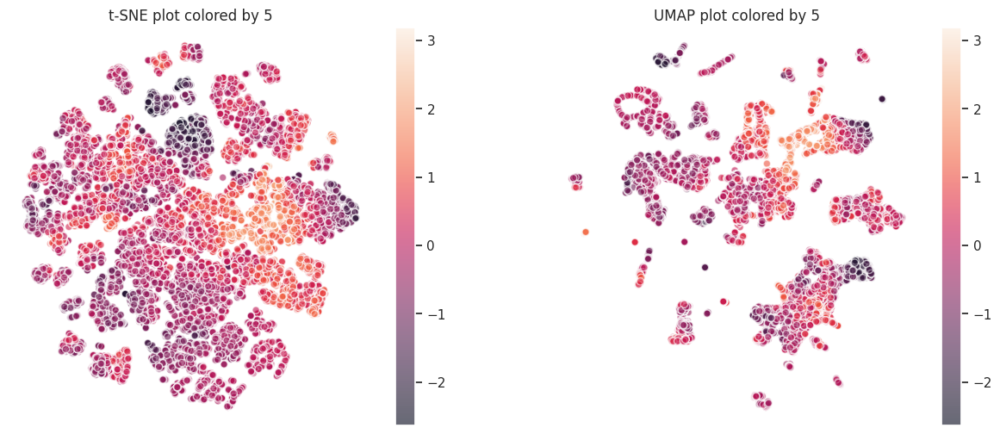

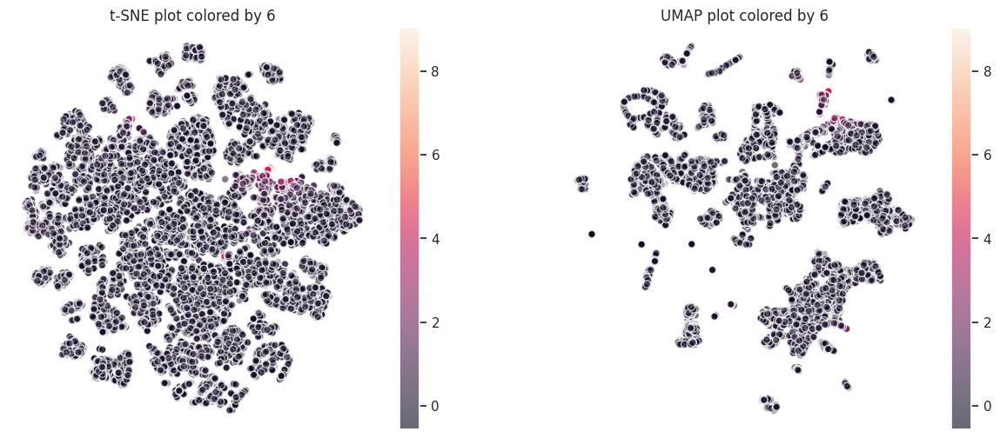

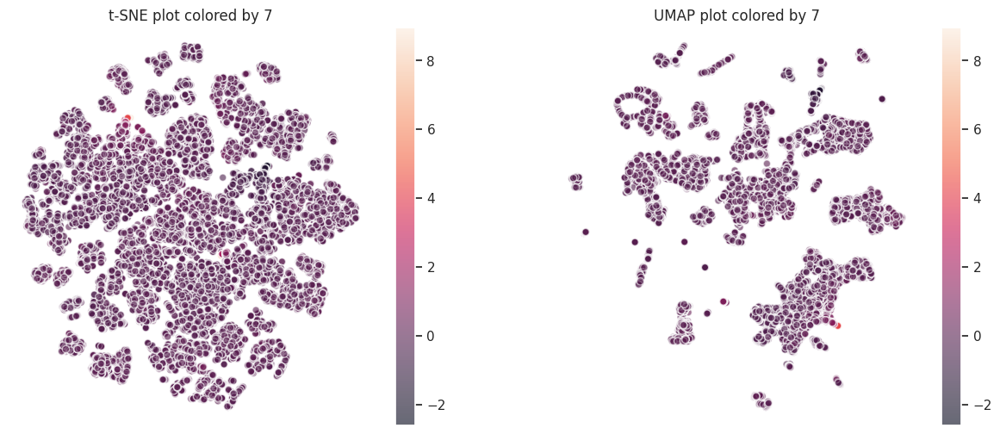

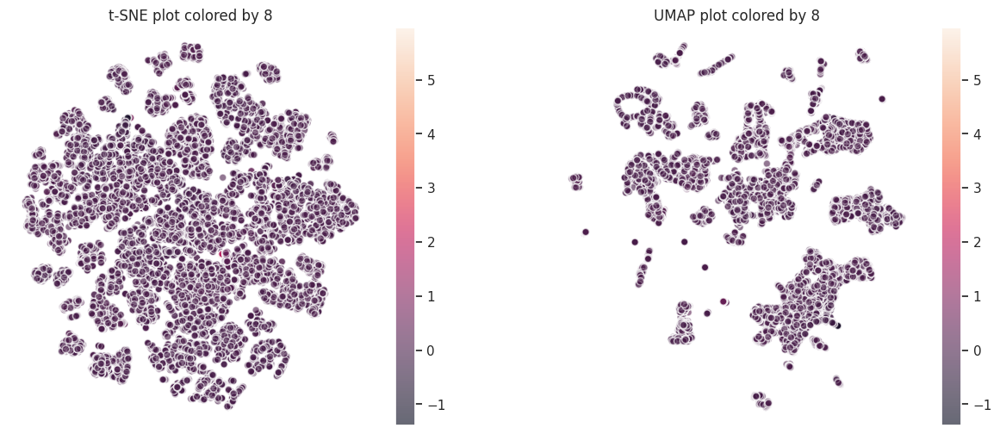

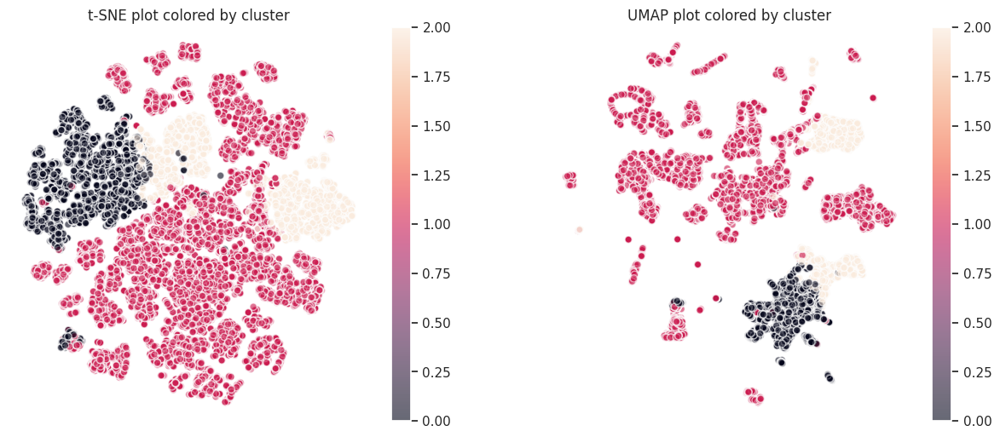

In [148]:
import matplotlib.pyplot as plt

# Adjust plot style
plt.rcParams['axes.facecolor'] = 'white' # makes the background white
plt.rcParams['grid.color'] = 'lightgrey' # makes gridlines light grey
plt.rcParams['grid.linestyle'] = '-' # defines the style of the gridlines
plt.rcParams['grid.linewidth'] = 0.5 # defines the width of the gridlines

# We'll use all numerical columns.
features_to_plot = data_num.columns.tolist()

for feature in features_to_plot:
    fig, axs = plt.subplots(1, 2, figsize=(15, 6))

    # t-SNE plot
    scatter = axs[0].scatter(tsne_df['TSNE1'], tsne_df['TSNE2'], c=data_num[feature], alpha=0.6, edgecolors='w')
    axs[0].set_title(f't-SNE plot colored by {feature}', fontsize=12)
    fig.colorbar(scatter, ax=axs[0])
    axs[0].grid(True)  # Add gridlines
    axs[0].set_xticks([])  # Remove x-axis values
    axs[0].set_yticks([])  # Remove y-axis values

    # UMAP plot
    scatter = axs[1].scatter(umap_df['UMAP1'], umap_df['UMAP2'], c=data_num[feature], alpha=0.6, edgecolors='w')
    axs[1].set_title(f'UMAP plot colored by {feature}', fontsize=12)
    fig.colorbar(scatter, ax=axs[1])
    axs[1].grid(True)  # Add gridlines
    axs[1].set_xticks([])  # Remove x-axis values
    axs[1].set_yticks([])  # Remove y-axis values

    plt.show()


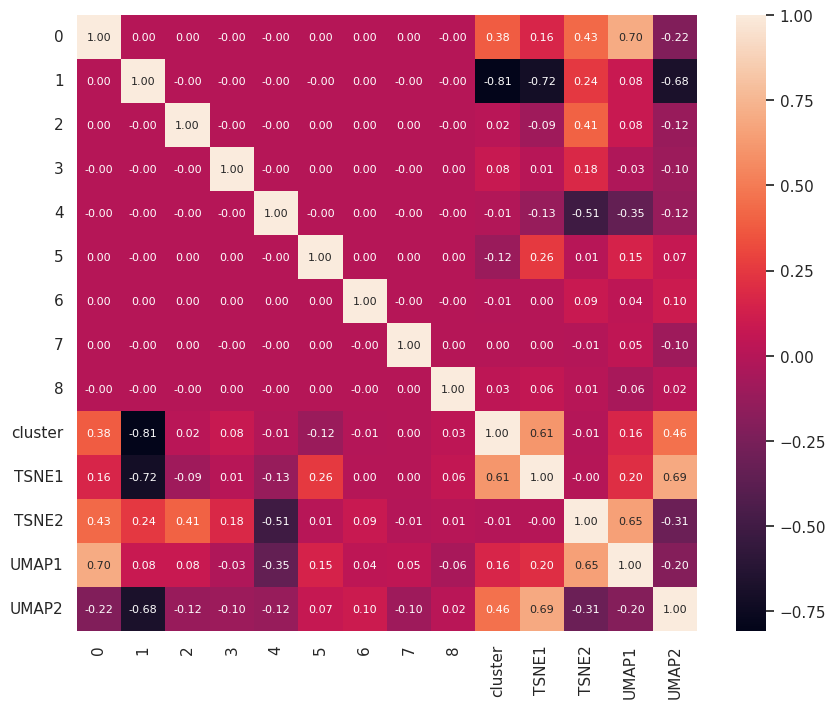

In [149]:
# Import necessary library
import seaborn as sns

# Convert tsne and umap results into DataFrame
tsne_df = pd.DataFrame(tsne_results, columns=["TSNE1", "TSNE2"])
umap_df = pd.DataFrame(umap_results, columns=["UMAP1", "UMAP2"])

# Concatenate the original and transformed features
combined_data = pd.concat([data_num, tsne_df, umap_df], axis=1)

# Compute the correlation matrix
corr_matrix = combined_data.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", annot_kws={"size": 8})  # Set annotation font size to 8
plt.show()


In [ ]:
from sklearn.metrics import silhouette_score

# Assume that 'kmeans' is your fitted KMeans model and 'data_scaled' is your scaled data
labels = kmeans.labels_
silhouette_avg = silhouette_score(data_scaled, labels)

print("The average silhouette_score is :", silhouette_avg)


The average silhouette_score is : 0.0307555750263231


In [ ]:
# Assume that 'data' is your original DataFrame and 'labels' are the cluster labels
data['cluster'] = labels

# Compute descriptive statistics for each cluster
cluster_descriptive_stats = data.groupby('cluster').describe()

print(cluster_descriptive_stats)


           area                                                              \
          count      mean       std       min       25%       50%       75%   
cluster                                                                       
0         918.0  0.036243  0.110149  0.000310  0.004349  0.011984  0.031943   
1         574.0  0.033542  0.070532  0.000213  0.004351  0.009914  0.033140   
2        1282.0  0.038630  0.100231  0.000240  0.004015  0.011688  0.035628   

                  Vegetation_Cover                                       \
              max            count       mean        std  min       25%   
cluster                                                                   
0        2.347218            918.0  28.516209  33.915417  0.0  2.400398   
1        0.776843            574.0  30.781922  35.809738  0.0  2.489337   
2        1.863992           1282.0  29.331208  34.670787  0.0  2.036921   

                                     Amenities_Total_Count             \
 

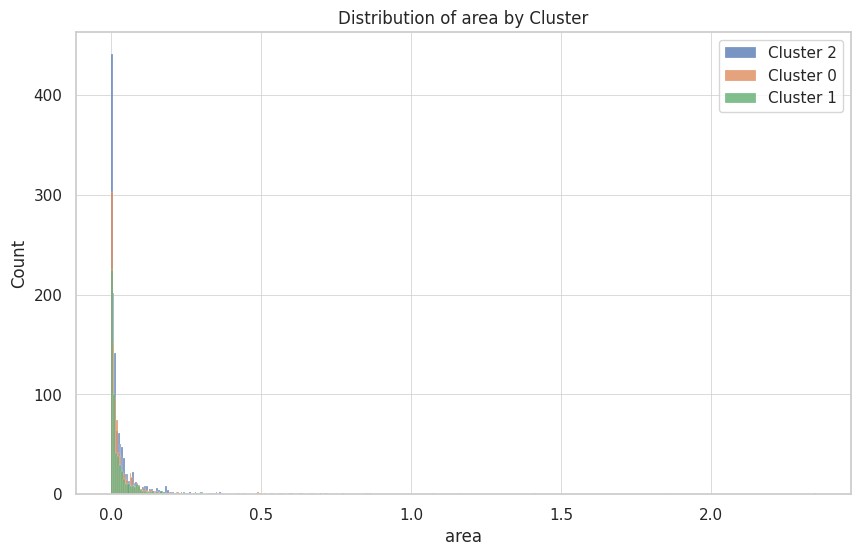

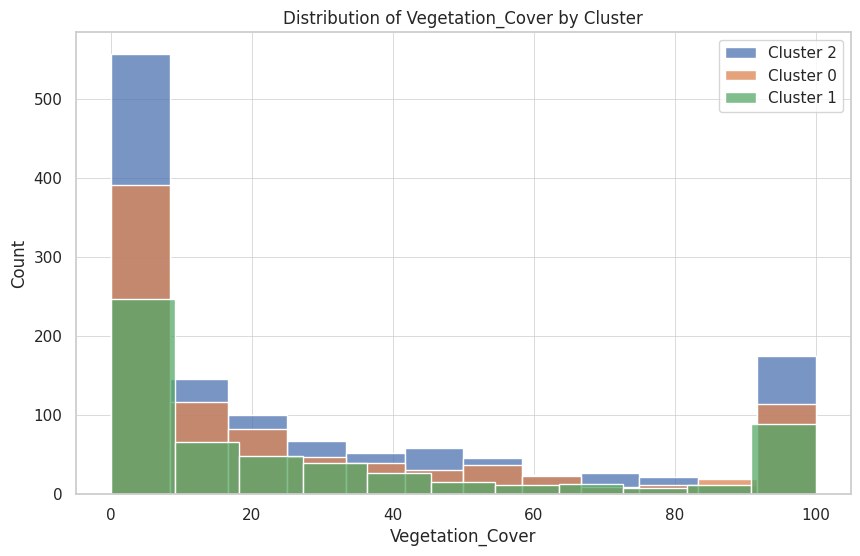

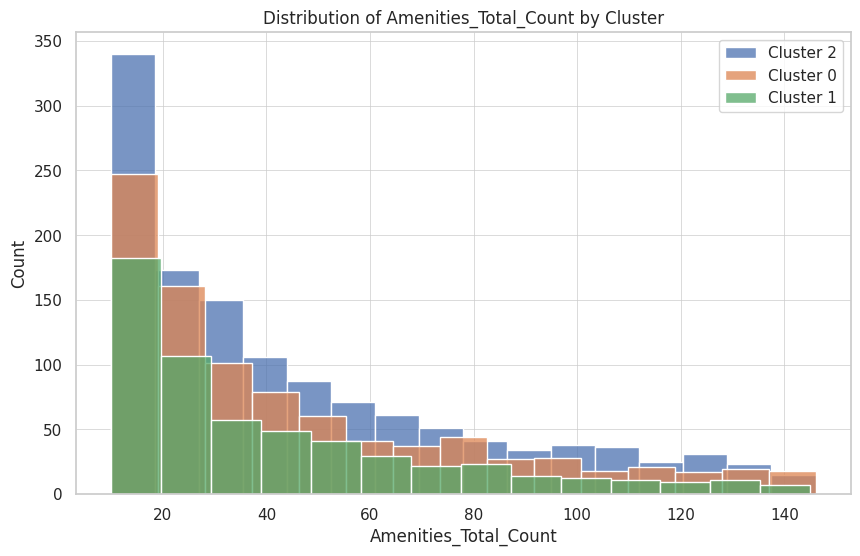

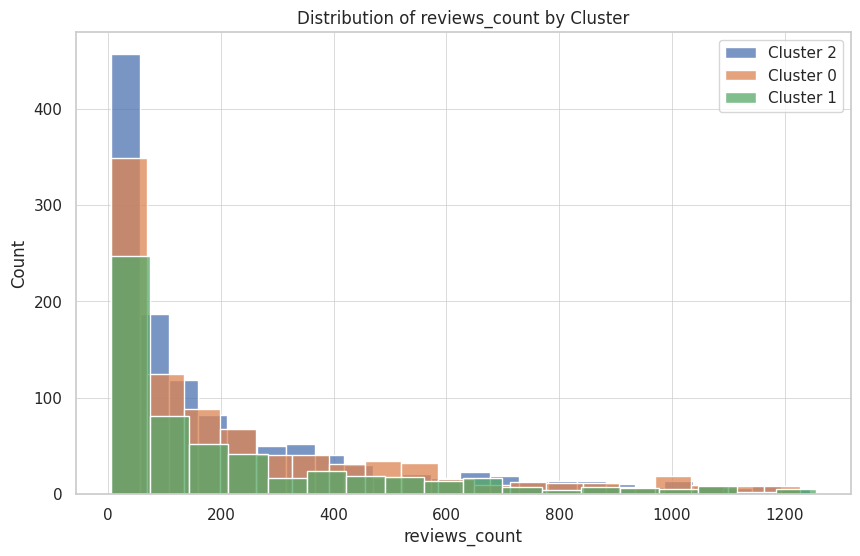

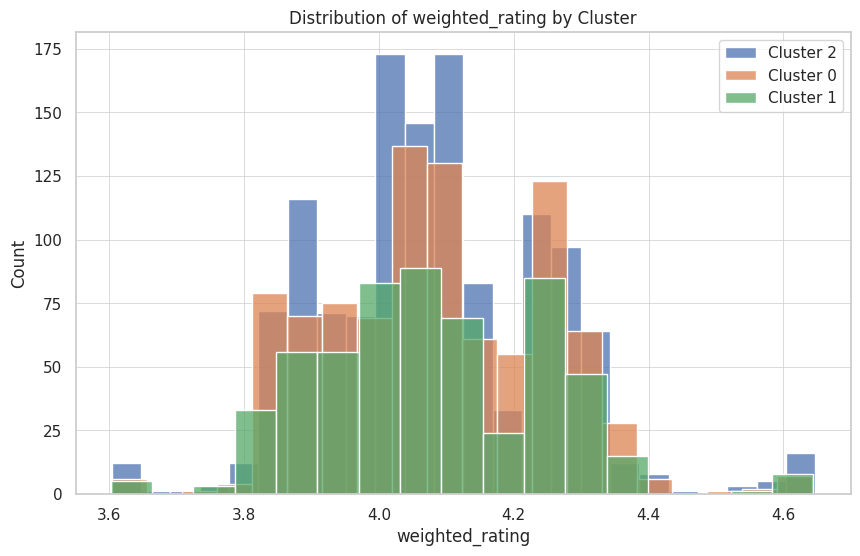

...

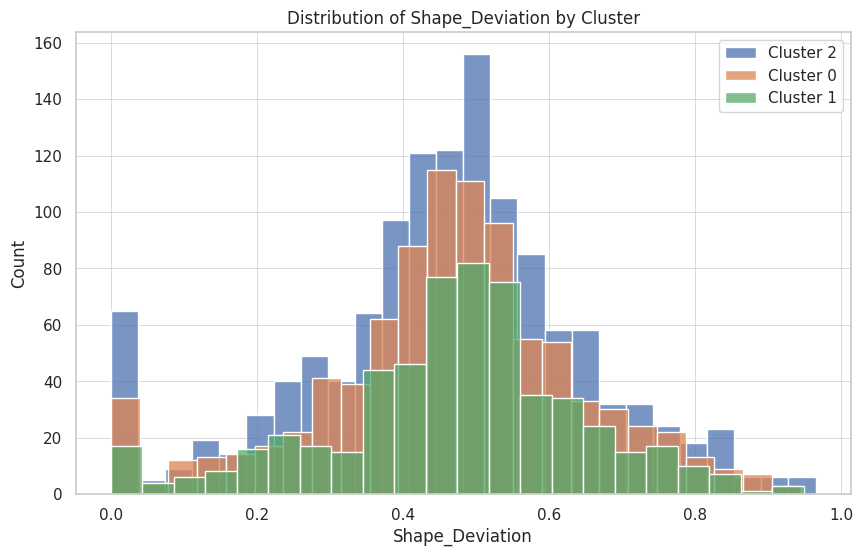

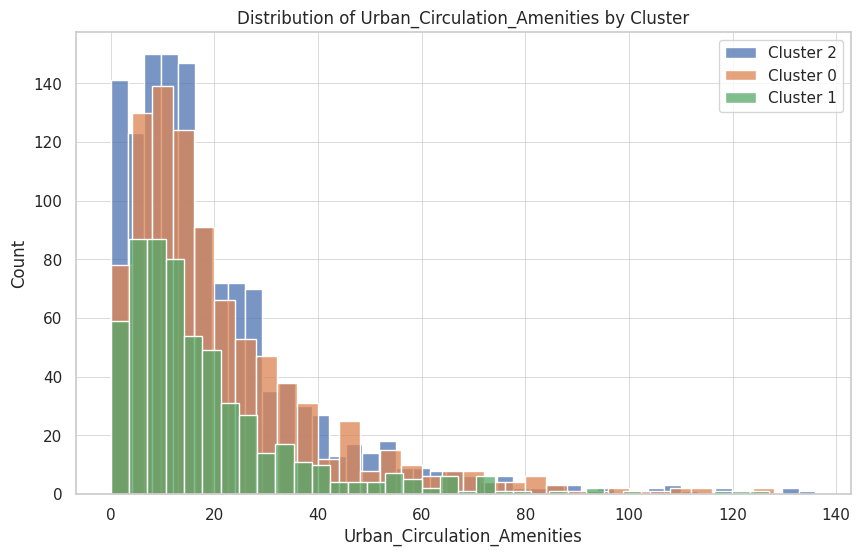

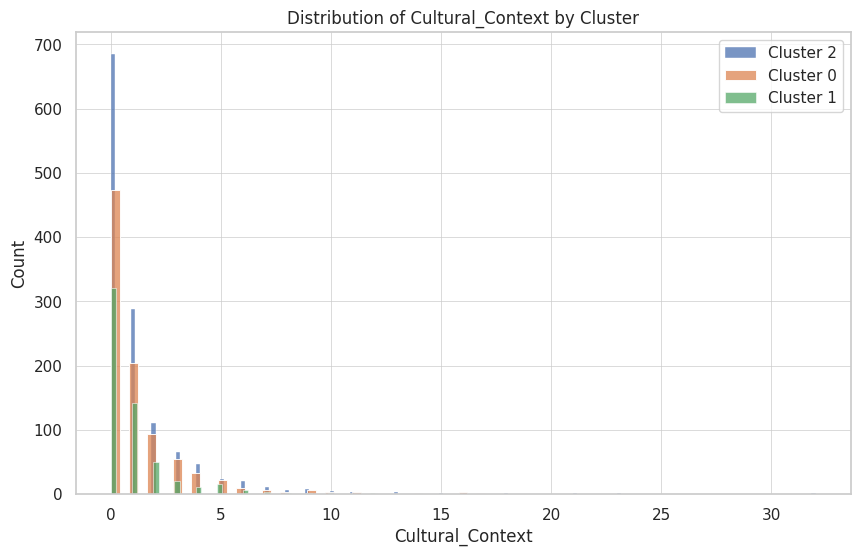

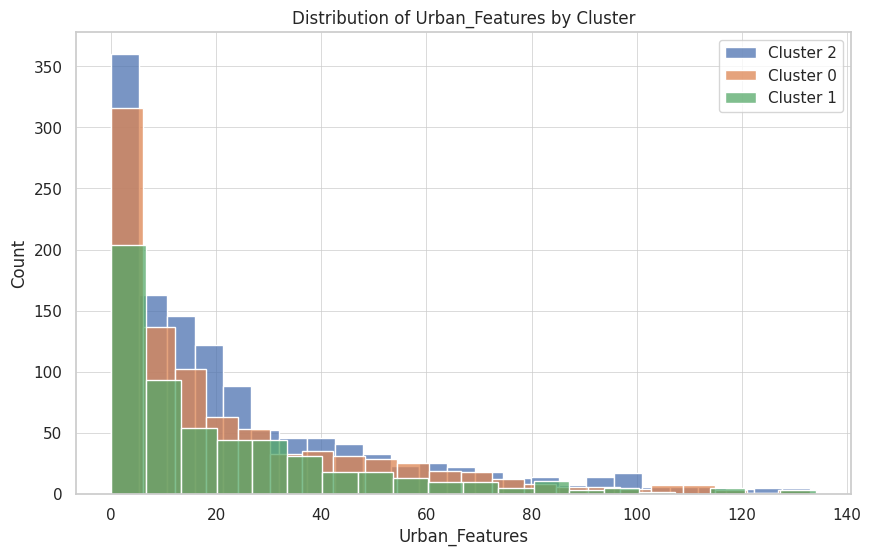

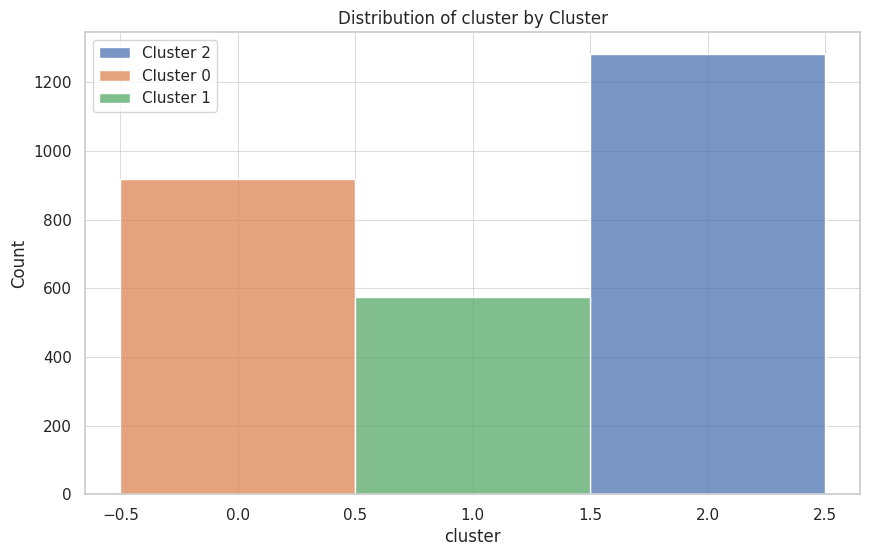

In [ ]:
# Assume that 'data_num' is your DataFrame containing only numeric columns
for column in data_num.columns:
    plt.figure(figsize=(10, 6))
    for cluster in data['cluster'].unique():
        sns.histplot(data_num.loc[data['cluster'] == cluster, column], kde=False, label=f'Cluster {cluster}')
    plt.title(f'Distribution of {column} by Cluster')
    plt.legend()
    plt.show()


In [ ]:
centroids_df

,area,Vegetation_Cover,Amenities_Total_Count,reviews_count,weighted_rating,sentiment_score,avg_review_time,Amenities_Diversity,Shape_Deviation,Urban_Circulation_Amenities,Cultural_Context,Urban_Features
0,0.040353,1018.610125,1609.586544,67943.835585,4.766073,1.168165,6.160708e+08,0.306249,0.546906,425.035601,3.903977,645.212430
1,0.040088,1096.066607,1478.932401,63301.666509,4.765612,1.163638,3.634062e+08,0.303990,0.548083,369.402094,3.227793,629.612667
2,0.040588,1045.015427,1631.674936,63087.921936,4.765184,1.165201,4.964107e+08,0.306454,0.545813,405.397489,3.924848,689.980347


In [ ]:
# Normalize per row
for i, row in centroids_df.iterrows():
    row_to_normalize = row.drop(['avg_review_time', 'reviews_count'])
    normalized_row = ((row_to_normalize - row_to_normalize.min()) /
                      (row_to_normalize.max() - row_to_normalize.min())) * 10
    centroids_df_adjusted.loc[i, normalized_row.index] = normalized_row

# Set 'avg_review_time' and 'reviews_count' manually
centroids_df_adjusted['avg_review_time'] = [6, 3, 5]
centroids_df_adjusted['reviews_count'] = [6.3, 6.3, 6.3]

# Generate the radar plots
for i, row in centroids_df_adjusted.iterrows():
    plot_spider(row, f'Cluster {i}')
